# eCommerce Customer Purchasing Behaviour Prediction using RFM & Machine Learning Approach

---

- **Name:**        ``Funmilola Aladegbola``
- **Matric:**      ``@00654265``
- **Degree:**      ``MSc, Data Science``
- **Date:**        ``May, 2023``
---

# Data Source:
- [Jewelry Dataset from Kaggle](https://www.kaggle.com/datasets/mkechinov/ecommerce-purchase-history-from-jewelry-store)

# Installing Dependencies

In [ ]:
# !conda install -c conda-forge py-xgboost

# Importing libraries

In [ ]:
# importing Libararies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as plotly
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from pandas import get_dummies
from sklearn.model_selection import train_test_split

# clustering algorithm
from sklearn.cluster import KMeans

# training algorithms
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

# ANN
from keras.models import Sequential, load_model
from keras.layers import Dense, LSTM, Embedding, RepeatVector
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras import optimizers
from tensorflow.keras.utils import plot_model
from keras.utils.np_utils import to_categorical

# evaluation metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score

# saving trained model with pickle
import pickle

%matplotlib inline

# GDrive

In [ ]:
# Connecting Google Colab to Google Drive
from google.colab import drive
drive.mount("/content/gdrive")


Mounted at /content/gdrive


In [ ]:
PWD = "/content/gdrive/MyDrive/My MSC Project/Cutomer Purchase Behaviour Prediction"
DATASET_PATH = f'{PWD}/datasets'
RESULT_PATH = f'{PWD}/results'
MODEL_PATH = f'{PWD}/trained_models'

# Local

In [ ]:
#DATASET_PATH = 'datasets/eCommerce_jewelry_dataset'
#RESULT_PATH = 'results'
#MODEL_PATH = 'trained_models'

In [ ]:
pwd

'/content'

# Loading datasets

In [ ]:
######################################
### Cosmetics eCOMMERCE DATA #######
######################################
# jewelry_data = pd.read_csv("datasets/eCommerce_jewelry_dataset/jewelry.csv")

####################################
### COSMETICS eCOMMERCE DATA #######
####################################
# oct_2019 = pd.read_csv(f"{PWD}/datasets/cosmetics_data/Oct-2019.csv", parse_dates=True, index_col=0)
# nov_2019 = pd.read_csv(f"{PWD}/datasets/cosmetics_data/Nov-2019.csv", parse_dates=True, index_col=0)
# dec_2019 = pd.read_csv(f"{PWD}/datasets/cosmetics_data/Dec-2019.csv", parse_dates=True, index_col=0)
# jan_2020 = pd.read_csv(f"{PWD}/datasets/cosmetics_data/Jan-2020.csv", parse_dates=True, index_col=0)
# feb_2020 = pd.read_csv(f"{PWD}/datasets/cosmetics_data/Feb-2020.csv", parse_dates=True, index_col=0)

# cosmetics_data = pd.concat([oct_2019, nov_2019, dec_2019, jan_2020, feb_2020], axis='index')

# # Cleaning the RAM
# del oct_2019
# del nov_2019
# del dec_2019
# del jan_2020
# del feb_2020

In [ ]:
####################################
### JEWELRY eCOMMERCE DATA #######
####################################

col_names = ['order_id', 'product_id', 'sku_order_qty', 'category_id', 'category_alias', 'brand_id', 'price', 'user_id', 'prod_gender', 'main_color', 'main_metal', 'main_gem']
jewelry_data = pd.read_csv(f"{DATASET_PATH}/jewelry.csv", parse_dates=True, index_col=0, names=col_names)

In [ ]:
jewelry_data.head()

,order_id,product_id,sku_order_qty,category_id,category_alias,brand_id,price,user_id,prod_gender,main_color,main_metal,main_gem
2018-12-01 11:40:29+00:00,1924719191579951782,1842195256808833386,1,1.806829e+18,jewelry.earring,0.0,561.51,1.515916e+18,NaN,red,gold,diamond
2018-12-01 17:38:31+00:00,1924899396621697920,1806829193678291446,1,1.806829e+18,NaN,NaN,212.14,1.515916e+18,NaN,yellow,gold,NaN
2018-12-02 13:53:42+00:00,1925511016616034733,1842214461889315556,1,1.806829e+18,jewelry.pendant,1.0,54.66,1.515916e+18,f,white,gold,sapphire
2018-12-02 17:44:02+00:00,1925626951238681511,1835566849434059453,1,1.806829e+18,jewelry.pendant,0.0,88.90,1.515916e+18,f,red,gold,diamond
2018-12-02 21:30:19+00:00,1925740842841014667,1873936840742928865,1,1.806829e+18,jewelry.necklace,0.0,417.67,1.515916e+18,NaN,red,gold,amethyst


# Exploratory Data Analysis (EDA)

In [ ]:
jewelry_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 95911 entries, 2018-12-01 11:40:29+00:00 to 2021-12-01 09:59:07+00:00
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   order_id        95911 non-null  int64  
 1   product_id      95911 non-null  int64  
 2   sku_order_qty   95911 non-null  int64  
 3   category_id     90559 non-null  float64
 4   category_alias  85978 non-null  object 
 5   brand_id        91126 non-null  float64
 6   price           90559 non-null  float64
 7   user_id         90559 non-null  float64
 8   prod_gender     47743 non-null  object 
 9   main_color      88251 non-null  object 
 10  main_metal      90449 non-null  object 
 11  main_gem        61853 non-null  object 
dtypes: float64(4), int64(3), object(5)
memory usage: 9.5+ MB


## Moderating data types

As shown above, almost all the id's are treated as integer and even floating point types, since these are going to be used only for identification purposes, as opposed to computational purposes, hence the need to moderate them.

In [ ]:
jewelry_data.order_id = jewelry_data.order_id.astype(str, copy=False)
jewelry_data.product_id = jewelry_data.product_id.astype(str, copy=False)
jewelry_data.category_id = jewelry_data.category_id.astype(str, copy=False)
jewelry_data.brand_id = jewelry_data.brand_id.astype(str, copy=False)
jewelry_data.user_id = jewelry_data.user_id.astype(str, copy=False)

In [ ]:
# Accessing datatypes after moderation
jewelry_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 95911 entries, 2018-12-01 11:40:29+00:00 to 2021-12-01 09:59:07+00:00
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   order_id        95911 non-null  object 
 1   product_id      95911 non-null  object 
 2   sku_order_qty   95911 non-null  int64  
 3   category_id     95911 non-null  object 
 4   category_alias  85978 non-null  object 
 5   brand_id        95911 non-null  object 
 6   price           90559 non-null  float64
 7   user_id         95911 non-null  object 
 8   prod_gender     47743 non-null  object 
 9   main_color      88251 non-null  object 
 10  main_metal      90449 non-null  object 
 11  main_gem        61853 non-null  object 
dtypes: float64(1), int64(1), object(10)
memory usage: 9.5+ MB


In [ ]:
print(f'Shape of Dataset: {jewelry_data.shape}')
print(f'Total No of observations (rows): {jewelry_data.shape[0]}')
print(f'Total No of variables(columns): {jewelry_data.shape[1]}')

Shape of Dataset: (95911, 12)
Total No of observations (rows): 95911
Total No of variables(columns): 12


In [ ]:
# Descriptive statistics (Statistical Summary)
jewelry_data.describe(include='all')

,order_id,product_id,sku_order_qty,category_id,category_alias,brand_id,price,user_id,prod_gender,main_color,main_metal,main_gem
count,95911,95911,95911.0,95911,85978,95911,90559.000000,95911,47743,88251,90449,61853
unique,74760,9613,NaN,26,218,2538,NaN,31080,2,5,3,30
top,2421954597749784864,1956663847725040099,NaN,1.8068292018907384e+18,jewelry.earring,0.0,NaN,nan,f,red,gold,diamond
freq,26,526,NaN,29001,29052,44600,NaN,5352,47379,69511,89082,29610
mean,NaN,NaN,1.0,NaN,NaN,NaN,362.215217,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,0.0,NaN,NaN,NaN,444.155706,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,1.0,NaN,NaN,NaN,0.990000,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,1.0,NaN,NaN,NaN,145.620000,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,1.0,NaN,NaN,NaN,258.770000,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,1.0,NaN,NaN,NaN,431.370000,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Descriptive stats summary
jewelry_data.describe(include='all').fillna('-')

,order_id,product_id,sku_order_qty,category_id,category_alias,brand_id,price,user_id,prod_gender,main_color,main_metal,main_gem
count,95911,95911,95911.0,95911,85978,95911,90559.0,95911,47743,88251,90449,61853
unique,74760,9613,-,26,218,2538,-,31080,2,5,3,30
top,2421954597749784864,1956663847725040099,-,1.8068292018907384e+18,jewelry.earring,0.0,-,nan,f,red,gold,diamond
freq,26,526,-,29001,29052,44600,-,5352,47379,69511,89082,29610
mean,-,-,1.0,-,-,-,362.215217,-,-,-,-,-
std,-,-,0.0,-,-,-,444.155706,-,-,-,-,-
min,-,-,1.0,-,-,-,0.99,-,-,-,-,-
25%,-,-,1.0,-,-,-,145.62,-,-,-,-,-
50%,-,-,1.0,-,-,-,258.77,-,-,-,-,-
75%,-,-,1.0,-,-,-,431.37,-,-,-,-,-


## Treating Missing Values

In [ ]:
# Accessing missing values
jewelry_data.isnull().sum()

order_id              0
product_id            0
sku_order_qty         0
category_id           0
category_alias     9933
brand_id              0
price              5352
user_id               0
prod_gender       48168
main_color         7660
main_metal         5462
main_gem          34058
dtype: int64

In [ ]:
print('Percentages of missing values\n')
np.round((jewelry_data.isnull().sum() / len(jewelry_data)) * 100, 2)

Percentages of missing values



order_id           0.00
product_id         0.00
sku_order_qty      0.00
category_id        0.00
category_alias    10.36
brand_id           0.00
price              5.58
user_id            0.00
prod_gender       50.22
main_color         7.99
main_metal         5.69
main_gem          35.51
dtype: float64

In [ ]:
plotly.bar(np.round((jewelry_data.isnull().sum() / len(jewelry_data)) * 100, 2).sort_values(ascending=False), 
          title='Percentage of missing values per variable')

### Exploring missing columns for better understanding of how to treat them

- **"price" column**

In [ ]:
# accessing the observations with missing value for price
jewelry_data[jewelry_data.price.isnull()]

,order_id,product_id,sku_order_qty,category_id,category_alias,brand_id,price,user_id,prod_gender,main_color,main_metal,main_gem
2019-01-26 05:51:21+00:00,1965130913738130034,1937825427510789079,1,nan,230.12,1.5506129490794255e+18,NaN,nan,NaN,NaN,NaN,NaN
2019-02-05 08:39:25+00:00,1972463258694582403,1536903766496772737,1,nan,202.36,1.3251562147067994e+18,NaN,nan,NaN,NaN,NaN,NaN
2019-02-14 10:54:07+00:00,1979054038959784609,1515966222721436570,1,nan,1098.03,1.5159156252163763e+18,NaN,nan,NaN,NaN,NaN,NaN
2019-02-14 10:54:07+00:00,1979054038959784609,1463130437630034093,1,nan,321.78,1.5159156252163763e+18,NaN,nan,NaN,NaN,NaN,NaN
2019-02-14 10:55:34+00:00,1979054768877732525,1515966222725319293,1,nan,1128.62,1.5159156252163763e+18,NaN,nan,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-01 08:58:49+00:00,2718992028972089719,1515966223638498936,1,nan,0.00,1.515915625715458e+18,NaN,nan,NaN,NaN,NaN,NaN
2021-12-01 09:05:55+00:00,2718995597712425499,1515966223677246857,1,nan,0.00,1.5159156257203448e+18,NaN,nan,NaN,NaN,NaN,NaN
2021-12-01 09:14:01+00:00,2718999678082351855,1536902230743974482,1,nan,0.00,1.5159156256954138e+18,NaN,nan,NaN,NaN,NaN,NaN
2021-12-01 09:33:22+00:00,2719009418078322840,1465165964994675113,1,nan,0.00,1.5159156257155935e+18,NaN,nan,NaN,NaN,NaN,NaN


# *
----
It can be observed above that the observations containing null for price has missing values for all other relevant fields, as such, the rows for missing price values can be dropped.

---


In [ ]:
# Dropping rows with missing price
jewelry_data.dropna(axis=0, subset=['price'], inplace=True)

- **"main_gem" column**

In [ ]:
# Accessing "main_gem" distribution
jewelry_data.main_gem.value_counts()

diamond                29610
fianit                 12051
topaz                   6318
pearl                   3632
garnet                  2704
sapphire                1866
amethyst                1632
mix                     1479
emerald                  833
quartz                   540
amber                    228
spinel                   156
ruby                     151
quartz_smoky              93
nanocrystal               88
nacre                     78
chrysolite                74
citrine                   51
tourmaline                50
sitall                    44
corundum_synthetic        41
coral                     41
agate                     24
turquoise                 22
rhodolite                 18
emerald_geothermal         9
chrysoprase                6
onyx                       6
garnet_synthetic           6
sapphire_geothermal        2
Name: main_gem, dtype: int64

Text(0, 0.5, 'Counts')

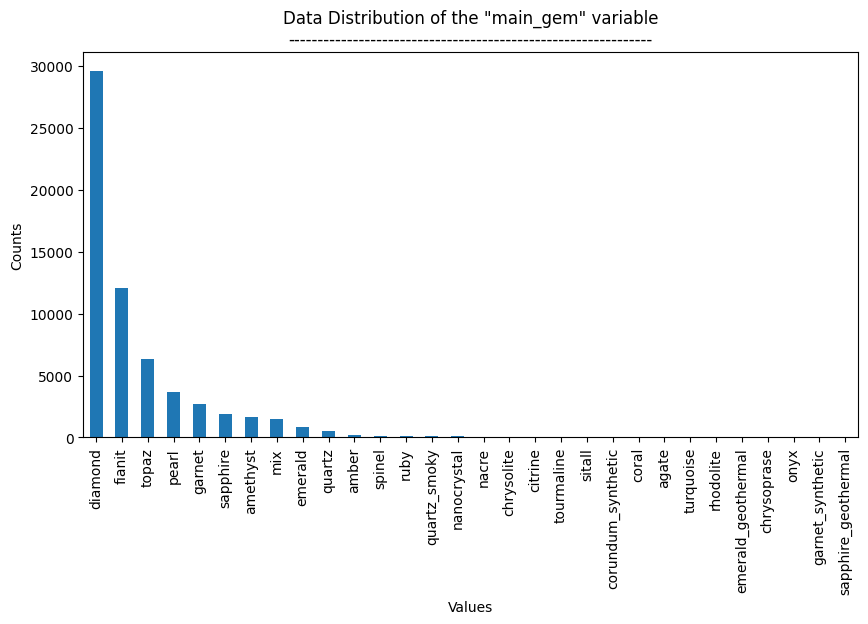

In [ ]:
# "main_gem" data distribution
plt.figure(figsize=(10,5))
jewelry_data.main_gem.value_counts().plot.bar()
plt.title('Data Distribution of the "main_gem" variable\n' + '-' * 62)
plt.xlabel('Values')
plt.ylabel('Counts')

In [ ]:
plotly.bar(jewelry_data.main_gem.value_counts(), title='Data Distribution of the "main_gem" variable')

- **"prod_gender" column**

In [ ]:
# exploring "prod_gender" distribution
pd.DataFrame(jewelry_data.prod_gender.value_counts())

,prod_gender
f,47379
m,364


In [ ]:
# visualizing "prod_gender" data distribution
prod_gender_count = pd.DataFrame(jewelry_data.prod_gender.value_counts())
prod_gender_count.index = prod_gender_count.index.map({'f':'f (female)', 'm':'m (male)'})

plotly.bar(prod_gender_count, title='Data Distribution of "prod_gender" (Before Cleaning)')

In [ ]:
# percentage(%) of data distribution of "prod_gender" 
pd.DataFrame(jewelry_data.prod_gender.value_counts() / jewelry_data.prod_gender.value_counts().sum() * 100)

,prod_gender
f,99.237585
m,0.762415


## Filling the missing values, having explored the missing columns

In [ ]:
# substituting values for other columns with missing data
jewelry_data.category_alias.fillna("others", inplace=True)
jewelry_data.prod_gender.fillna("others", inplace=True) 
jewelry_data.main_color.fillna(jewelry_data.main_color.mode()[0], inplace=True)
jewelry_data.main_metal.fillna(jewelry_data.main_metal.mode()[0], inplace=True)
jewelry_data.main_gem.fillna('others', inplace=True)

**The following decisions were made for filling missing values for each column:**
1. *main_gem:* 
  - Jewelry's value is mostly determined by the gem_type it is made of, the most frequent gem, as shown from the data distribution is "diamond".
-About 35% of the jewelry gem is missing, hence filling all 35% missing values  with the value of the most occuring (mode) value ("diamond" gem), would not be the best decision. This is because of the high value of diamond.
 -Gem type has higher impact on pricing, it is unlikely that a diamong gem jewelry would be left unfilled during record entry. 

    **Decision Taken:** "others" will be used to populate the missing gem       values.


2. *prod_gender*:
  - 99% of the entire dataset observations currently not missing are "f" (Female), a highly skewed data, although it is expected for females products to be sold more often at jewelry stores since females patronizes jewelry stores more frequently.

  - 50% of the total observations contain missing values for the "prod_gender" (product gender) column. Considering the size of the missing data, using the most occurring value to fill the entire missing values (50% of total observations), with the data already extremely skewed towards "f" value (99%), will create more imballance and render the "m" (male) value completely insignificant.

  **Decision Taken:**  All missing values in the prod_gender column will be populated with "others". 


3. *The remaining fields with missing values:*
  - Considering the small number of missing values for the remaining columns, the mode value of the columns was used to fill-in the missing values


In [ ]:
jewelry_data.isnull().sum()

order_id          0
product_id        0
sku_order_qty     0
category_id       0
category_alias    0
brand_id          0
price             0
user_id           0
prod_gender       0
main_color        0
main_metal        0
main_gem          0
dtype: int64

In [ ]:
jewelry_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 90559 entries, 2018-12-01 11:40:29+00:00 to 2021-12-01 09:59:07+00:00
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   order_id        90559 non-null  object 
 1   product_id      90559 non-null  object 
 2   sku_order_qty   90559 non-null  int64  
 3   category_id     90559 non-null  object 
 4   category_alias  90559 non-null  object 
 5   brand_id        90559 non-null  object 
 6   price           90559 non-null  float64
 7   user_id         90559 non-null  object 
 8   prod_gender     90559 non-null  object 
 9   main_color      90559 non-null  object 
 10  main_metal      90559 non-null  object 
 11  main_gem        90559 non-null  object 
dtypes: float64(1), int64(1), object(10)
memory usage: 9.0+ MB


## Exploring Data Distributions

In [ ]:
# Total Products
print(f'Total Number of Unique Products Purchased: {jewelry_data.product_id.nunique()}')

Total Number of Unique Products Purchased: 8272


In [ ]:
# Total Products
print(f'Total Unique Orders (Total Transactions) Made within Period: {jewelry_data.order_id.nunique()}')

Total Unique Orders (Total Transactions) Made within Period: 70933


### "prod_gender"

In [ ]:
# Renaming prod_gend values for interpretability
jewelry_data.prod_gender = jewelry_data.prod_gender.map({'f':'female', 'm':'male', 'others':'others'})

In [ ]:
# Gender-based products counts
gender_counts = pd.DataFrame(jewelry_data.prod_gender.value_counts())
gender_counts

,prod_gender
female,47379
others,42816
male,364


In [ ]:
plotly.bar(gender_counts, title='"prod_gender" Distribution (After Clearning)', color=gender_counts.index )

### "product_id"

#### Product Purchase rate

In [ ]:
product_purchase_counts = jewelry_data.product_id.value_counts()
product_purchase_counts

1956663847725040099    526
1515966223577083202    468
1956663840242401751    428
1352907200745439279    369
1956663847666319760    350
                      ... 
1515966222979441002      1
1956663846424806223      1
1515966222738815524      1
1956663845661442164      1
1515966223419078514      1
Name: product_id, Length: 8272, dtype: int64

#### 30 most-purchased Products

In [ ]:
plotly.bar(product_purchase_counts[:30], title='30 Most-Purchased Products')

#### Least-purchased Products

In [ ]:
purchased_once = product_purchase_counts[product_purchase_counts == 1]

print(f'Number of products purchased only once: {len(purchased_once)}\n\n')

# Showing 10 of the products purchased only once
print(f'Showing 10 of the {len(purchased_once)} products purchased only once')
purchased_once[-10:]

Number of products purchased only once: 2507


Showing 10 of the 2507 products purchased only once


1372056042329866387    1
1515966223031340320    1
1956663836182315589    1
1515966223501725866    1
1515966223500265193    1
1515966222979441002    1
1956663846424806223    1
1515966222738815524    1
1956663845661442164    1
1515966223419078514    1
Name: product_id, dtype: int64

In [ ]:
# Showing details of some products purchased only once
jewelry_data[jewelry_data.product_id.map(lambda x: x in list(purchased_once.index))]

,order_id,product_id,sku_order_qty,category_id,category_alias,brand_id,price,user_id,prod_gender,main_color,main_metal,main_gem
2018-12-02 17:44:02+00:00,1925626951238681511,1835566849434059453,1,1.8068292019159043e+18,jewelry.pendant,0.0,88.90,1.5159156252076308e+18,female,red,gold,diamond
2018-12-02 22:09:34+00:00,1925760595336888995,1835566854827934449,1,1.8068292018907384e+18,jewelry.earring,1.0,102.27,1.5159156252344758e+18,others,red,gold,others
2018-12-03 09:48:34+00:00,1926112416450478161,1836278824443052965,1,1.8068292018907384e+18,jewelry.earring,1.0,217.40,1.5159156250818253e+18,others,red,gold,diamond
2018-12-03 09:48:34+00:00,1926112416450478161,1877637299521454325,1,1.8068292018823498e+18,jewelry.ring,1.0,180.71,1.5159156250818253e+18,others,white,gold,diamond
2018-12-03 18:43:00+00:00,1926381405764321762,1807462768563979237,1,1.8068292018907384e+18,jewelry.earring,0.0,84.45,1.5159156252319363e+18,others,white,gold,fianit
...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-30 09:51:00+00:00,2718293518727512749,1956663848320631770,1,1.8068292018823498e+18,jewelry.ring,1.0,301.23,1.515915625571752e+18,female,red,gold,diamond
2021-11-30 09:57:20+00:00,2718296700878848773,1837448225196343820,1,1.8068292018907384e+18,jewelry.earring,1.0,251.68,1.5159156253978452e+18,others,red,gold,fianit
2021-11-30 15:00:57+00:00,2718449515521638663,1875414832958669509,1,1.8068292018823498e+18,jewelry.ring,1.0,2263.73,1.5159156256231014e+18,female,white,gold,diamond
2021-11-30 15:08:17+00:00,2718453208816025954,1956663836048097738,1,1.8068292018907384e+18,jewelry.earring,1.0,289.00,1.5159156250895672e+18,female,yellow,gold,quartz


### "sku_order_qty"

In [ ]:
jewelry_data.sku_order_qty.value_counts()

1    90559
Name: sku_order_qty, dtype: int64

**This *"sku_order_qty"* column is not useful as it contains only the value of 1 for all observations, hence won't contribute anything to our analysis nor modeling**

So, we are dropping it

In [ ]:
# dropping the "sku_order_qty" column
jewelry_data.drop(columns=['sku_order_qty'], inplace=True)
jewelry_data.head()

,order_id,product_id,category_id,category_alias,brand_id,price,user_id,prod_gender,main_color,main_metal,main_gem
2018-12-01 11:40:29+00:00,1924719191579951782,1842195256808833386,1.8068292018907384e+18,jewelry.earring,0.0,561.51,1.5159156252078513e+18,others,red,gold,diamond
2018-12-01 17:38:31+00:00,1924899396621697920,1806829193678291446,1.8068292018487954e+18,others,nan,212.14,1.51591562507197e+18,others,yellow,gold,others
2018-12-02 13:53:42+00:00,1925511016616034733,1842214461889315556,1.8068292019159043e+18,jewelry.pendant,1.0,54.66,1.5159156250484936e+18,female,white,gold,sapphire
2018-12-02 17:44:02+00:00,1925626951238681511,1835566849434059453,1.8068292019159043e+18,jewelry.pendant,0.0,88.90,1.5159156252076308e+18,female,red,gold,diamond
2018-12-02 21:30:19+00:00,1925740842841014667,1873936840742928865,1.8068292019242929e+18,jewelry.necklace,0.0,417.67,1.5159156251753293e+18,others,red,gold,amethyst


### "category_alias"

In [ ]:
cat_alias_counts = pd.DataFrame(jewelry_data.category_alias.value_counts())
cat_alias_counts

,category_alias
jewelry.earring,29052
jewelry.ring,28300
jewelry.pendant,13088
others,9933
jewelry.bracelet,6188
jewelry.necklace,2361
jewelry.brooch,1288
jewelry.souvenir,170
electronics.clocks,167
jewelry.stud,12


In [ ]:
plotly.bar(cat_alias_counts, 
           title='Data Districution of the "product_category_alias" column',
           color=cat_alias_counts.index,
          )

### "brand_id"

In [ ]:
# Accessing Purchase by brand
jewelry_data.brand_id.value_counts()

0.0    44600
1.0    32022
2.0     8966
nan     4785
4.0       65
3.0       58
6.0       56
5.0        7
Name: brand_id, dtype: int64

---
As observed there are missing values in the brand_id column, "nan", and the values seems to be treated as floating points

---

In [ ]:
# Treating the missing value and requlating the datatype into int type
jewelry_data.brand_id.replace(to_replace='nan', value=jewelry_data.brand_id.mode()[0], inplace=True)
jewelry_data.brand_id = jewelry_data.brand_id.astype(np.float64).astype(np.int16)

In [ ]:
brand_counts = pd.DataFrame(jewelry_data.brand_id.value_counts())
brand_counts

,brand_id
0,49385
1,32022
2,8966
4,65
3,58
6,56
5,7


In [ ]:
plotly.bar(brand_counts, 
           title='Data Distribution of "brand_id" [Purchase by Brands] (After Cleaning)',
           color=brand_counts.index
          )

In [ ]:
plotly.area(brand_counts, 
           title='Data Distribution of "brand_id" [Purchase by Brands] (After Cleaning)',
           color=brand_counts.index
          )

### "prod_gender"

In [ ]:
prod_gender_counts = pd.DataFrame(jewelry_data.prod_gender.value_counts())
prod_gender_counts

,prod_gender
female,47379
others,42816
male,364


In [ ]:
plotly.bar(prod_gender_counts, title='Data Distribution of the "prod_gender" Column (After Cleaning)',
          color=prod_gender_counts.index)

### "main_color"

In [ ]:
main_color_counts = pd.DataFrame(jewelry_data.main_color.value_counts())
main_color_counts

,main_color
red,71819
white,15286
yellow,3388
unknown-color,64
black,2


In [ ]:
cd_map = {v:v for v in main_color_counts.index if v != 'unknown-color'}
cd_map["unknown-color"] = '#435423'

plotly.bar(main_color_counts, 
           title='Data Distribution of the Jewelry\'s "main_color"',
           color=main_color_counts.index,
           color_discrete_map=cd_map
          )

### "main_metal"

In [ ]:
main_metal_counts = pd.DataFrame(jewelry_data.main_metal.value_counts())
main_metal_counts

,main_metal
gold,89192
silver,1365
platinum,2


In [ ]:
plotly.bar(main_metal_counts, 
           title='Data Distribution of the Jewelry\'s "main_metal" Column',
           color=main_metal_counts.index,
           color_discrete_map={'gold':'gold', 'silver':'silver', 'platinum':'#E5E4E2'}
          )

In [ ]:
plotly.pie(main_metal_counts, 
           title='Data Distribution of the Jewelry\'s "main_metal" Column',
           names=main_metal_counts.index,
           values='main_metal',
           color_discrete_map={'gold':'gold', 'silver':'silver', 'platinum':'#E5E4E2'},
           hole=0.5
          )

### "main_gem"

In [ ]:
main_gem_counts = pd.DataFrame(jewelry_data.main_gem.value_counts())
main_gem_counts

,main_gem
diamond,29610
others,28706
fianit,12051
topaz,6318
pearl,3632
garnet,2704
sapphire,1866
amethyst,1632
mix,1479
emerald,833


In [ ]:
plotly.area(main_gem_counts, title='Data Distribution of the Jewelry\'s "main_gem" column')

# Analyzing Total Sales Made

## Sales made by brand

In [ ]:
# Highest selling brand
sales_by_brand = jewelry_data[['brand_id','price']].groupby(
    by=['brand_id']).sum().sort_values(
    by='price', ascending=False)

sales_by_brand

,price
brand_id,
0,17241448.07
1,12564192.05
2,2959659.90
6,22916.81
3,7178.94
4,5374.61
5,1077.50


In [ ]:
plotly.bar(
    sales_by_brand, 
    title='Total Purchases (Sales) Made by Brand')

## Sales made by product

In [ ]:
# Highest selling product
sales_by_product = jewelry_data[['product_id','price']].groupby(
    by=['product_id']).sum().sort_values(
    by='price', ascending=False)

sales_by_product

,price
product_id,
1806829191514031042,247480.52
1956663836668854462,219755.44
1956663836668854461,201361.60
1956663847708262860,184792.21
1313614230015967859,153674.90
...,...
1956663847674708384,3.97
1320290641988551642,2.88
1840638201165775183,2.10


In [ ]:
# Top 20 Highest Selling Products
plotly.bar(data_frame=sales_by_product[:20], title='Top-20 High-Selling Products')

## Sales made by category

In [ ]:
# Highest Selling Category
sales_by_cat_alias = jewelry_data[['category_alias','price']].groupby(
    by=['category_alias']).sum().sort_values(
    by='price', ascending=False)

sales_by_cat_alias

,price
category_alias,
jewelry.earring,11512213.58
jewelry.ring,10364450.88
others,4382181.23
jewelry.bracelet,3056475.12
jewelry.pendant,2200662.97
jewelry.necklace,915307.77
jewelry.brooch,289639.41
electronics.clocks,71032.78
jewelry.souvenir,6255.06


In [ ]:
plotly.area(
    sales_by_cat_alias, 
    title='Total Purchases (Sales) Made by Product Category',
    color=sales_by_cat_alias.index
)

In [ ]:
plotly.pie(sales_by_cat_alias, 
           names=sales_by_cat_alias.index,
           values='price',
           title='Total Purchases (Sales) Made by Product Category',
           hole=0.5
          )

## Sales made by main_color type

In [ ]:
# Highest Selling Category
sales_by_color = jewelry_data[['main_color','price']].groupby(
    by=['main_color']).sum().sort_values(
    by='price', ascending=False)

sales_by_color

,price
main_color,
red,24518094.68
white,6164449.83
yellow,2091132.73
unknown-color,27885.70
black,284.94


In [ ]:
plotly.bar(
    sales_by_color, 
    title='Total Purchases (Sales) Made by Jewelry\'s Main Color',
    color=sales_by_color.index,
)

In [ ]:
plotly.pie(
    sales_by_color, 
    names=sales_by_color.index,
    values='price',
    title='Total Purchases (Sales) Made by Jewelry\'s Main Color',
    color=sales_by_color.index,
    hole=0.5
)

## Sales made by main_metal type

In [ ]:
# Highest Selling Category
sales_by_metal = jewelry_data[['main_metal','price']].groupby(
    by=['main_metal']).sum().sort_values(
    by='price', ascending=False)

sales_by_metal

,price
main_metal,
gold,32705934.63
silver,94222.84
platinum,1690.41


In [ ]:
plotly.bar(
    sales_by_metal, 
    title='Total Purchases (Sales) Made by Jewelry\'s Main Metal',
    color=sales_by_metal.index,
)

In [ ]:
plotly.pie(
    sales_by_metal, 
    names=sales_by_metal.index,
    values='price',
    title='Total Purchases (Sales) Made by Jewelry\'s Main Metal',
    color=sales_by_metal.index,
    hole=0.5
)

## Sales made by main_gem type

In [ ]:
# Highest Selling Category
sales_by_gem = jewelry_data[['main_gem','price']].groupby(
    by=['main_gem']).sum().sort_values(
    by='price', ascending=False)

sales_by_gem

,price
main_gem,
diamond,14866978.68
others,7996682.02
topaz,2186230.22
fianit,2158198.60
mix,1316185.40
pearl,1181007.86
garnet,1019846.31
amethyst,594561.00
sapphire,593569.90


In [ ]:
plotly.bar(
    sales_by_gem, 
    title='Total Purchases (Sales) Made by Jewelry\'s Main Gem',
    color=sales_by_gem.index,
)

In [ ]:
plotly.area(
    sales_by_gem, 
    title='Total Purchases (Sales) Made by Jewelry\'s Main Gem'
)

In [ ]:
# plt.figure(figsize=(12,6))
plotly.line(jewelry_data.price)

# Exploring Outliers

## using Boxplots

In [ ]:
plotly.box(jewelry_data.price)

<Axes: >

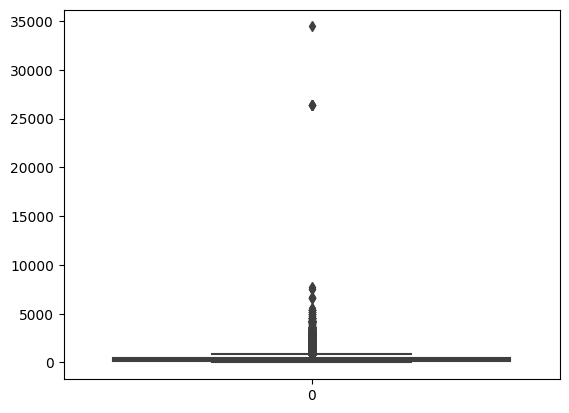

In [ ]:
# Exploring Outliers
sns.boxplot(jewelry_data.price)

---
As shown above, there are some outliers above the $10,000

---

In [ ]:
# detected outliers
jewelry_data[jewelry_data.price > 8000]

,order_id,product_id,category_id,category_alias,brand_id,price,user_id,prod_gender,main_color,main_metal,main_gem
2019-12-12 11:10:22+00:00,2197219707247919178,1886843062370435482,1.8068292018907384e+18,jewelry.earring,0,34448.60,1.5159156253806848e+18,female,white,gold,diamond
2021-01-06 02:03:53+00:00,2480331971528491488,1515966223500113689,1.8068292018823498e+18,jewelry.ring,0,26424.52,1.5159156255733266e+18,others,white,gold,mix
2021-08-21 11:04:01+00:00,2645127914613375819,1515966223500113689,1.8068292018823498e+18,jewelry.ring,0,26424.52,1.515915625431895e+18,others,white,gold,mix
2021-10-28 14:20:05+00:00,2694511350922609195,1515966223500113689,1.8068292018823498e+18,jewelry.ring,0,26424.52,1.515915625702742e+18,others,white,gold,mix
2021-11-01 10:56:01+00:00,2697307746616738398,1515966223500113689,1.8068292018823498e+18,jewelry.ring,0,26424.52,1.5159156257044877e+18,others,white,gold,mix
2021-11-24 12:46:08+00:00,2714033011531186978,1515966223500113689,1.8068292018823498e+18,jewelry.ring,0,26424.52,1.51591562570967e+18,others,white,gold,mix


In [ ]:
#### Further confirmation using the Interquartile Range (IQR) #####
###################################################################

# stats_desc = pd.DataFrame(jewelry_data.price.describe())
# stats_desc

# Q1 = stats_desc.loc['25%'].values[0]
# Q3 = stats_desc.loc['75%'].values[0]

# IQR = Q3 - Q1

# lbound = (Q1 - 1.5 * IQR)
# ubound = (Q3 + 1.5 * IQR)

# print(f'lbound = {lbound}')
# print(f'ubound = {ubound}')

# jewelry_data.loc[((jewelry_data.price < lbound) | (jewelry_data.price > ubound)), :]

In [ ]:
#### More confirmation of outliers using z-score ####
#####################################################

# mean = jewelry_data.price.mean()
# std = jewelry_data.price.std()
# z_score_lbound = -3
# z_score_ubound = 3

# jewelry_data.loc[(
#     (((jewelry_data.price - mean) / std) < z_score_lbound) | (((jewelry_data.price - mean) / std) < z_score_ubound)), :]

---
**Conisdering the cost of jewelries there is every possibility that there are extremely expensive jewelries that are rarely purchased, therefore the outliers is understanble to be a normal trend within the jewelry business domain**

---

# Analyzing Customer Purchase Behaviour 

## using the RFM (Recency, Frequency, Monetary) Model

RFM computation Idea borrowed from [https://hallyudigital.com/blog/build-rfm-model-excel](https://hallyudigital.com/blog/build-rfm-model-excel)

In [ ]:
jewelry_data.head()

,order_id,product_id,category_id,category_alias,brand_id,price,user_id,prod_gender,main_color,main_metal,main_gem
2018-12-01 11:40:29+00:00,1924719191579951782,1842195256808833386,1.8068292018907384e+18,jewelry.earring,0,561.51,1.5159156252078513e+18,others,red,gold,diamond
2018-12-01 17:38:31+00:00,1924899396621697920,1806829193678291446,1.8068292018487954e+18,others,0,212.14,1.51591562507197e+18,others,yellow,gold,others
2018-12-02 13:53:42+00:00,1925511016616034733,1842214461889315556,1.8068292019159043e+18,jewelry.pendant,1,54.66,1.5159156250484936e+18,female,white,gold,sapphire
2018-12-02 17:44:02+00:00,1925626951238681511,1835566849434059453,1.8068292019159043e+18,jewelry.pendant,0,88.90,1.5159156252076308e+18,female,red,gold,diamond
2018-12-02 21:30:19+00:00,1925740842841014667,1873936840742928865,1.8068292019242929e+18,jewelry.necklace,0,417.67,1.5159156251753293e+18,others,red,gold,amethyst


## Preparing Data Summary and Computing RFM from the Available Transactional data

In [ ]:
# Adding the event_date_time component as part of the features (necessary for recency computation)
jewelry_data['event_date_time'] = jewelry_data.index.values
jewelry_data.head()

,order_id,product_id,category_id,category_alias,brand_id,price,user_id,prod_gender,main_color,main_metal,main_gem,event_date_time
2018-12-01 11:40:29+00:00,1924719191579951782,1842195256808833386,1.8068292018907384e+18,jewelry.earring,0,561.51,1.5159156252078513e+18,others,red,gold,diamond,2018-12-01 11:40:29
2018-12-01 17:38:31+00:00,1924899396621697920,1806829193678291446,1.8068292018487954e+18,others,0,212.14,1.51591562507197e+18,others,yellow,gold,others,2018-12-01 17:38:31
2018-12-02 13:53:42+00:00,1925511016616034733,1842214461889315556,1.8068292019159043e+18,jewelry.pendant,1,54.66,1.5159156250484936e+18,female,white,gold,sapphire,2018-12-02 13:53:42
2018-12-02 17:44:02+00:00,1925626951238681511,1835566849434059453,1.8068292019159043e+18,jewelry.pendant,0,88.90,1.5159156252076308e+18,female,red,gold,diamond,2018-12-02 17:44:02
2018-12-02 21:30:19+00:00,1925740842841014667,1873936840742928865,1.8068292019242929e+18,jewelry.necklace,0,417.67,1.5159156251753293e+18,others,red,gold,amethyst,2018-12-02 21:30:19


In [ ]:
# Sample data inputed from the date_time index which was the event_date_time that transaction was done
jewelry_data.index.values

array(['2018-12-01T11:40:29.000000000', '2018-12-01T17:38:31.000000000',
       '2018-12-02T13:53:42.000000000', ...,
       '2021-12-01T09:52:06.000000000', '2021-12-01T09:55:35.000000000',
       '2021-12-01T09:59:07.000000000'], dtype='datetime64[ns]')

In [ ]:
# Extracting only features useful for RFM model computations

trans_data = jewelry_data[['user_id', 'order_id', 'price', 'event_date_time']]

# grouping transactions by cutomer, order, and event_date, then aggregating by the sum of the prices paid 
temp_trans = trans_data.groupby(by=['user_id', 'order_id', 'event_date_time']).sum(numeric_only=True)
temp_trans

price
user_id                order_id            event_date_time             
1.3135543336100173e+18 2340909844019544170 2020-06-27 17:17:01   272.47
1.3135555415863468e+18 2101514055465304870 2019-08-02 10:00:19   259.97
                       2364530755616375792 2020-07-30 07:27:33   309.27
                       2677795032978685991 2021-10-05 12:47:45  1219.04
                       2677799379720470679 2021-10-05 12:56:23  2030.51
...                                                                 ...
1.5542306197460751e+18 2435695199846924649 2020-11-05 11:58:36   386.26
                       2438624127838323468 2020-11-09 12:57:51    95.75
1.5542968554314793e+18 2411710791477625289 2020-10-03 09:45:51   212.19
                       2478340229694488623 2021-01-03 08:06:39   356.03
                       2478346470693011579 2021-01-03 08:19:03   328.63

[70933 rows x 1 columns]

In [ ]:
# Sample: how to get the index
temp_trans.index

MultiIndex([('1.3135543336100173e+18', '2340909844019544170', ...),
            ('1.3135555415863468e+18', '2101514055465304870', ...),
            ('1.3135555415863468e+18', '2364530755616375792', ...),
            ('1.3135555415863468e+18', '2677795032978685991', ...),
            ('1.3135555415863468e+18', '2677799379720470679', ...),
            ( '1.313565915903689e+18', '2048591679123882292', ...),
            ( '1.313565915903689e+18', '2298225264938714002', ...),
            ( '1.313565915903689e+18', '2298225948274721708', ...),
            ( '1.313565915903689e+18', '2643894017099563103', ...),
            ( '1.313582215799505e+18', '2621082024315716049', ...),
            ...
            ('1.5506129490794255e+18', '2718888179741491662', ...),
            ('1.5524326559648328e+18', '2648644283082473544', ...),
            ('1.5536344341697004e+18', '2468402626983624961', ...),
            ('1.5536344341697004e+18', '2546053354690183168', ...),
            ('1.5536344341697004

In [ ]:
# Showing top 20 records
temp_trans[:20]

price
user_id                order_id            event_date_time             
1.3135543336100173e+18 2340909844019544170 2020-06-27 17:17:01   272.47
1.3135555415863468e+18 2101514055465304870 2019-08-02 10:00:19   259.97
                       2364530755616375792 2020-07-30 07:27:33   309.27
                       2677795032978685991 2021-10-05 12:47:45  1219.04
                       2677799379720470679 2021-10-05 12:56:23  2030.51
1.313565915903689e+18  2048591679123882292 2019-05-21 09:33:00  1938.08
                       2298225264938714002 2020-04-29 19:50:22    58.77
                       2298225948274721708 2020-04-29 19:51:44    71.10
                       2643894017099563103 2021-08-19 18:12:29   746.44
1.313582215799505e+18  2621082024315716049 2021-07-19 06:49:07   130.00
1.3135910334428618e+18 1991871364897702082 2019-03-04 03:19:52   212.19
                       2002273061717410386 2019-03-18 11:46:10   242.42
                       2095708218020856557 2019-07-25 09:45:09   269.82
                       2121071238951469670 2019-08-29 09:36:57   486.03
                       2154997314253488196 2019-10-15 05:02:00   623.89
                       2402821112577655648 2020-09-21 03:23:39   232.74
1.3135965984789635e+18 2208068938594517469 2019-12-27 10:25:51    11.99
                       2208924245067563904 2019-12-28 14:45:11    11.99
1.3136054893297016e+18 1963027901901176990 2019-01-23 08:13:03   320.96
                       1994189104320873386 2019-03-07 08:04:48   109.45

In [ ]:
# extracting index-values
user_id,order,date_time = temp_trans.index[1]
print(f' user_id: {user_id} \n order_id: {order} \n event_date_time: {date_time}')

 user_id: 1.3135555415863468e+18 
 order_id: 2101514055465304870 
 event_date_time: 2019-08-02 10:00:19


In [ ]:
# Sample: how to get the price of item at location 1 (2nd item)
temp_trans.loc[user_id,order,date_time][0]

259.97

In [ ]:
# accessing price value
temp_trans.loc[user_id,order,date_time]

price    259.97
Name: (1.3135555415863468e+18, 2101514055465304870, 2019-08-02 10:00:19), dtype: float64

In [ ]:
# accessing price value
temp_trans.loc[user_id,order,date_time][0]

259.97

In [ ]:
# Sample: how to display customer a's (a=user_id of customer a, at item 1) transaction records
temp_trans.loc[user_id,:,:]

,,price
order_id,event_date_time,
2101514055465304870,2019-08-02 10:00:19,259.97
2364530755616375792,2020-07-30 07:27:33,309.27
2677795032978685991,2021-10-05 12:47:45,1219.04
2677799379720470679,2021-10-05 12:56:23,2030.51


In [ ]:
# max(
#     np.array([
#         '2019-08-02 10:00:19', '2020-07-30 07:27:33', 
#         '2021-10-05 12:47:45', '2021-10-05 12:56:23'
#     ]).astype(np.datetime64)
# )

In [ ]:
# max(['2019-08-02 10:00:19', '2020-07-30 07:27:33', '2021-10-05 12:47:45', '2021-10-05 12:56:23'])

In [ ]:
# Sample: how to get the most recent purchase date of customer with id 'user_id'
# (Recency = today - recent_purchase_date) --  days since last purchase

max([dt for (_,dt) in temp_trans.loc[user_id,:,:].index])

Timestamp('2021-10-05 12:56:23')

In [ ]:
# Sample: to get the total number of orders (i.e. order_count) made by customer with id 'user_id'
# (Frequency -- no of orders made by the customer)

len(temp_trans.loc[user_id,:,:])

4

In [ ]:
# Sample: to get the sum of all total price spent by customer with id 'user_id'
# (Monetary -- total or avg money spent by the customer)

temp_trans.loc[user_id,:,:].sum()[0]

3818.79

In [ ]:
# Sample: to get the avg money spent by customer with id 'user_id' 
# (Monetary -- total or avg money spent by the customer)

temp_trans.loc[user_id,:,:].mean()[0]

954.6975

## My custom utility function to extract summarized data from the relevant dataset fields for RFM modeling

In [ ]:
def summarize_data(df):
    """
    My utility function to extract key fields and summarize it from the df
    """
    
    summary = {}
    cust_ids = []
    count_orders = []
    max_dates = []
    total_purchases = []
    avg_purchases = []
    
    for user_id, order_id, event_dt in df.index:
        
        # if user_id not already added to lis, add it and calculate transaction details for user
        if user_id not in cust_ids: 
            cust_ids.append(user_id) # customer
            
            tmp = df.loc[user_id,:,:]
            
            # Recency, last purchase date of the customer (part-measure)
            max_dt = max([dt for (_,dt) in tmp.index])
            max_dates.append(max_dt) 
            
            # Frequency, order counts
            count_orders.append(len(tmp)) 
            
            # Monetary, total or avg money spent by the customer
            total_spendings = np.round(tmp.sum()[0], 2)
            total_purchases.append(total_spendings)
            
            avg_spendings = np.round(tmp.mean()[0], 2)
            avg_purchases.append(avg_spendings)


    summary = {
        'user_id':cust_ids, 
        'order_counts':count_orders, 
        'recent_order_date_time':max_dates, 
        'total_purchase_price':total_purchases,
        'avg_purchases_price':avg_purchases
    }
    
    return pd.DataFrame(summary)

In [ ]:
# Calling the utility function to compute and extract relevant data summary for RFM

data_summary = summarize_data(df=temp_trans)
data_summary.head()

,user_id,order_counts,recent_order_date_time,total_purchase_price,avg_purchases_price
0,1.3135543336100173e+18,1,2020-06-27 17:17:01,272.47,272.47
1,1.3135555415863468e+18,4,2021-10-05 12:56:23,3818.79,954.70
2,1.313565915903689e+18,4,2021-08-19 18:12:29,2814.39,703.60
3,1.313582215799505e+18,1,2021-07-19 06:49:07,130.00,130.00
4,1.3135910334428618e+18,6,2020-09-21 03:23:39,2067.09,344.52


In [ ]:
data_summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31079 entries, 0 to 31078
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   user_id                 31079 non-null  object        
 1   order_counts            31079 non-null  int64         
 2   recent_order_date_time  31079 non-null  datetime64[ns]
 3   total_purchase_price    31079 non-null  float64       
 4   avg_purchases_price     31079 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(1)
memory usage: 1.2+ MB


## Calculating RFM - Recency (R), Frequency (F) and Monetary (M) values

In [ ]:
# # To compute recency, we calculate the difference in days between today and the last purchase date by a customer

# from datetime import datetime as dt

# today = dt.today()
# today_repeated = np.repeat(today, len(data_summary)).astype(np.datetime64)
# data_summary['today_date_time'] = today_repeated

In [ ]:
# print(f'Today: {today}')
# print(f'Today Repeated:\n {today_repeated}')

In [ ]:
from datetime import datetime

# dt1 = np.array(['2023-04-04T12:32:58.062467']).astype(np.datetime64)[0]

(np.array(['2023-04-04T12:32:58.062467']).astype(np.datetime64)[0] - data_summary.recent_order_date_time.max()).days


489

In [ ]:
# Recency (days)
data_summary['Recency'] = (data_summary.recent_order_date_time.max() - data_summary.recent_order_date_time).apply(lambda x: x.days)

# Frequency (total no of orders)
data_summary['Frequency'] = data_summary.order_counts

# Monetary (avg money spent in all) (NOTE: could also be total money spent)
data_summary["Monetary"] = data_summary.total_purchase_price

In [ ]:
data_summary.head()

,user_id,order_counts,recent_order_date_time,total_purchase_price,avg_purchases_price,Recency,Frequency,Monetary
0,1.3135543336100173e+18,1,2020-06-27 17:17:01,272.47,272.47,521,1,272.47
1,1.3135555415863468e+18,4,2021-10-05 12:56:23,3818.79,954.70,56,4,3818.79
2,1.313565915903689e+18,4,2021-08-19 18:12:29,2814.39,703.60,103,4,2814.39
3,1.313582215799505e+18,1,2021-07-19 06:49:07,130.00,130.00,135,1,130.00
4,1.3135910334428618e+18,6,2020-09-21 03:23:39,2067.09,344.52,436,6,2067.09


# Treating Outliers Before Scoring

In [ ]:
plotly.box(data_summary.Recency, title='Accessing Recency Outliers')

**Recency > 715 is an outlier**

In [ ]:
data_summary.Recency = data_summary.Recency.apply(lambda x: 715 if x > 715 else x)

In [ ]:
plotly.box(data_summary.Frequency, title='Accessing Frequency Outliers')

**Frequency > 3 is an outlier, can we really do much?**

We decided to pick 20 where the frequency value starts having visible gaps in the outliers

In [ ]:
data_summary.Frequency = data_summary.Frequency.apply(lambda x: 20 if x > 20 else x)

In [ ]:
plotly.box(data_summary.Monetary, title='Accessing Monetary Outliers')

**Monetary > 1,497.34 is an outlier**

In [ ]:
data_summary.Monetary = data_summary.Monetary.apply(lambda x: 1497.34 if x > 1497.34 else x)

# Creating RFM Scoring Thresholds

## Step1: Analysis of aggregates

In [ ]:
# Recency, Frequency and Monetary
print("\nAnalysis of RFM Aggregates\n" + "-" * 27)
data_summary[['Recency', 'Frequency', 'Monetary']].describe()


Analysis of RFM Aggregates
---------------------------


,Recency,Frequency,Monetary
count,31079.000000,31079.000000,31079.000000
mean,241.547218,1.811126,510.752563
std,187.425384,2.383412,457.944650
min,0.000000,1.000000,1.030000
25%,90.000000,1.000000,165.620000
50%,227.000000,1.000000,335.480000
75%,340.000000,2.000000,698.360000
max,715.000000,20.000000,1497.340000


In [ ]:
# Recency, Frequency and Monetary
print("\nAnalysis of RFM Aggregates\n" + "-" * 27)

recency = data_summary.Recency.values
frequency = data_summary.Frequency.values
monetary = data_summary.Monetary.values

labels = ["mean", "std", "min", "20%", "40%", "60%", "80%", "100%", "max"]

perc = {
    'recency': [
        np.mean(recency),
        np.std(recency),
        np.min(recency),
        np.percentile(recency, 20),
        np.percentile(recency, 40),
        np.percentile(recency, 60),
        np.percentile(recency, 80),
        np.percentile(recency, 100),
        np.max(recency),
    ],
    
    'frequency': [
        np.mean(frequency),
        np.std(frequency),
        np.min(frequency),
        np.percentile(frequency, 20),
        np.percentile(frequency, 40),
        np.percentile(frequency, 60),
        np.percentile(frequency, 80),
        np.percentile(frequency, 100),
        np.max(frequency),
    ],
    
    'monetary': [
        np.mean(monetary),
        np.std(monetary),
        np.min(monetary),
        np.percentile(monetary, 20),
        np.percentile(monetary, 40),
        np.percentile(monetary, 60),
        np.percentile(monetary, 80),
        np.percentile(monetary, 100),
        np.max(monetary),
    ]
}

aggregates_analysis = pd.DataFrame(perc, index=labels).round(2)
aggregates_analysis


Analysis of RFM Aggregates
---------------------------


,recency,frequency,monetary
mean,241.55,1.81,510.75
std,187.42,2.38,457.94
min,0.00,1.00,1.03
20%,64.00,1.00,142.20
40%,166.00,1.00,260.00
60%,276.00,1.00,431.37
80%,352.00,2.00,868.37
100%,715.00,20.00,1497.34
max,715.00,20.00,1497.34


In [ ]:
data_summary.Frequency.value_counts()[:30]

1     22019
2      4949
3      1704
4       740
5       467
20      269
6       250
7       167
8        97
9        81
10       72
12       58
11       39
13       36
14       31
15       28
16       22
17       20
18       19
19       11
Name: Frequency, dtype: int64

In [ ]:
data_summary[data_summary.Monetary > 1000]

,user_id,order_counts,recent_order_date_time,total_purchase_price,avg_purchases_price,Recency,Frequency,Monetary
1,1.3135555415863468e+18,4,2021-10-05 12:56:23,3818.79,954.70,56,4,1497.34
2,1.313565915903689e+18,4,2021-08-19 18:12:29,2814.39,703.60,103,4,1497.34
4,1.3135910334428618e+18,6,2020-09-21 03:23:39,2067.09,344.52,436,6,1497.34
6,1.3136054893297016e+18,10,2021-08-23 17:28:00,5476.27,547.63,99,10,1497.34
8,1.3136343076794537e+18,3,2019-10-12 22:50:09,1345.74,448.58,715,3,1345.74
...,...,...,...,...,...,...,...,...
31070,1.5451189481465446e+18,1,2019-10-21 20:43:56,1410.68,1410.68,715,1,1410.68
31072,1.5470498162849882e+18,4,2021-06-06 06:37:13,1166.44,291.61,178,4,1166.44
31073,1.548075485387293e+18,2,2020-12-25 22:59:48,2902.14,1451.07,340,2,1497.34
31074,1.5506129490794255e+18,183,2021-12-01 05:32:29,114240.62,624.27,0,20,1497.34


---
### From the statistical analysis of aggregates above, we can generate our weighted score for each measured components, as implemented in the scoring functions below

---

In [ ]:
aggregates_analysis

,recency,frequency,monetary
mean,241.55,1.81,510.75
std,187.42,2.38,457.94
min,0.00,1.00,1.03
20%,64.00,1.00,142.20
40%,166.00,1.00,260.00
60%,276.00,1.00,431.37
80%,352.00,2.00,868.37
100%,715.00,20.00,1497.34
max,715.00,20.00,1497.34


## My Custom Scoring Function

In [ ]:
# with recency, the smaller the days the more recent, hence, decreasing value with higher no of days
def score_recency(x):
    if x in range(0, 64) or x < 0:
        return 5
    elif x in range(64, 166):
        return 4
    elif x in range(166, 276):
        return 3
    elif x in range(276, 352):
        return 2
    else:
        return 1

In [ ]:
def score_frequency(x):
    if x in range(1, 3) or x < 1:
        return 1
    elif x in range(3, 5):
        return 2
    elif x in range(5, 10):
        return 3
    elif x in range(10, 15):
        return 4
    else:
        return 5

In [ ]:
def score_monetary(x):
    if x in range(1, 142) or x < 1:
        return 1
    elif x in range(142, 261):
        return 2
    elif x in range(261, 432):
        return 3
    elif x in range(432, 869):
        return 4
    else:
        return 5

In [ ]:
def classify_rfm(x):
    if x in range(1, 4) or x < 1:
        return 0
    elif x in range(4, 7):
        return 1
    elif x in range(7, 10):
        return 2
    elif x in range(10, 12):
        return 3
    else:
        return 4

# Scoring R,F&M

In [ ]:
data_summary['R_score'] = data_summary.Recency.apply(score_recency)
data_summary['F_score'] = data_summary.Frequency.apply(score_frequency)
data_summary['M_score'] = data_summary.Monetary.apply(score_monetary)
data_summary['RFM'] = data_summary[['R_score', 'F_score', 'M_score']].sum(axis=1)
data_summary['RFM_class'] = data_summary.RFM.apply(classify_rfm)

### Sorted in descending order of 'Recency', 'Frequency', 'Monetary'

In [ ]:
# Sorted in order of 'Recency', 'Frequency', 'Monetary'
data_summary.sort_values(by=['RFM', 'Recency', 'Frequency', 'Monetary'], ascending=False)

,user_id,order_counts,recent_order_date_time,total_purchase_price,avg_purchases_price,Recency,Frequency,Monetary,R_score,F_score,M_score,RFM,RFM_class
5059,1.5159156253951424e+18,22,2021-09-28 12:41:33,16970.53,771.39,63,20,1497.34,5,5,5,15,4
6056,1.5159156254670653e+18,21,2021-09-28 21:12:51,7069.49,336.64,63,20,1497.34,5,5,5,15,4
14285,1.51591562559903e+18,19,2021-09-29 09:14:55,13473.78,709.15,63,19,1497.34,5,5,5,15,4
4326,1.5159156253491197e+18,213,2021-09-29 12:44:04,158712.30,745.13,62,20,1497.34,5,5,5,15,4
1831,1.515915625192773e+18,39,2021-09-30 15:05:19,23061.31,591.32,61,20,1497.34,5,5,5,15,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9383,1.5159156255478932e+18,1,2020-12-03 11:40:59,130.00,130.00,362,1,130.00,1,1,1,3,0
9672,1.5159156255516774e+18,1,2020-12-07 06:06:59,130.00,130.00,359,1,130.00,1,1,1,3,0
10114,1.5159156255612375e+18,1,2020-12-11 17:45:49,130.00,130.00,354,1,130.00,1,1,1,3,0
10120,1.5159156255612608e+18,1,2020-12-11 17:07:35,130.00,130.00,354,1,130.00,1,1,1,3,0


In [ ]:
data_summary.RFM.value_counts()

8     6218
9     6153
10    5992
11    5813
7     5257
12     746
13     375
15     206
14     146
6       62
4       46
5       41
3       24
Name: RFM, dtype: int64

In [ ]:
data_summary.RFM_class.value_counts()

2    17628
3    11805
4     1473
1      149
0       24
Name: RFM_class, dtype: int64

### Sorted in descending order of 'Recency', 'Monetary', 'Frequency'

In [ ]:
# Sorted in descending order of 'Recency', 'Monetary', 'Frequency'
data_summary.sort_values(by=['RFM', 'Recency', 'Monetary', 'Frequency'], ascending=False)

,user_id,order_counts,recent_order_date_time,total_purchase_price,avg_purchases_price,Recency,Frequency,Monetary,R_score,F_score,M_score,RFM,RFM_class
5059,1.5159156253951424e+18,22,2021-09-28 12:41:33,16970.53,771.39,63,20,1497.34,5,5,5,15,4
6056,1.5159156254670653e+18,21,2021-09-28 21:12:51,7069.49,336.64,63,20,1497.34,5,5,5,15,4
14285,1.51591562559903e+18,19,2021-09-29 09:14:55,13473.78,709.15,63,19,1497.34,5,5,5,15,4
4326,1.5159156253491197e+18,213,2021-09-29 12:44:04,158712.30,745.13,62,20,1497.34,5,5,5,15,4
1831,1.515915625192773e+18,39,2021-09-30 15:05:19,23061.31,591.32,61,20,1497.34,5,5,5,15,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9383,1.5159156255478932e+18,1,2020-12-03 11:40:59,130.00,130.00,362,1,130.00,1,1,1,3,0
9672,1.5159156255516774e+18,1,2020-12-07 06:06:59,130.00,130.00,359,1,130.00,1,1,1,3,0
10114,1.5159156255612375e+18,1,2020-12-11 17:45:49,130.00,130.00,354,1,130.00,1,1,1,3,0
10120,1.5159156255612608e+18,1,2020-12-11 17:07:35,130.00,130.00,354,1,130.00,1,1,1,3,0


### Sorted in descending order of 'Frequency', 'Recency', 'Monetary'

In [ ]:
# Sorted in order of 'Frequency', 'Recency', 'Monetary'
data_summary.sort_values(by=['RFM', 'Frequency', 'Recency', 'Monetary'], ascending=False)

,user_id,order_counts,recent_order_date_time,total_purchase_price,avg_purchases_price,Recency,Frequency,Monetary,R_score,F_score,M_score,RFM,RFM_class
5059,1.5159156253951424e+18,22,2021-09-28 12:41:33,16970.53,771.39,63,20,1497.34,5,5,5,15,4
6056,1.5159156254670653e+18,21,2021-09-28 21:12:51,7069.49,336.64,63,20,1497.34,5,5,5,15,4
4326,1.5159156253491197e+18,213,2021-09-29 12:44:04,158712.30,745.13,62,20,1497.34,5,5,5,15,4
1831,1.515915625192773e+18,39,2021-09-30 15:05:19,23061.31,591.32,61,20,1497.34,5,5,5,15,4
7555,1.5159156255278328e+18,20,2021-10-01 13:55:59,11114.06,555.70,60,20,1497.34,5,5,5,15,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9383,1.5159156255478932e+18,1,2020-12-03 11:40:59,130.00,130.00,362,1,130.00,1,1,1,3,0
9672,1.5159156255516774e+18,1,2020-12-07 06:06:59,130.00,130.00,359,1,130.00,1,1,1,3,0
10114,1.5159156255612375e+18,1,2020-12-11 17:45:49,130.00,130.00,354,1,130.00,1,1,1,3,0
10120,1.5159156255612608e+18,1,2020-12-11 17:07:35,130.00,130.00,354,1,130.00,1,1,1,3,0


### Sorted in descending order of 'Frequency', 'Monetary', 'Recency'

In [ ]:
# Sorted in order of 'Frequency', 'Monetary', 'Recency'
data_summary.sort_values(by=['RFM', 'Frequency', 'Monetary', 'Recency'], ascending=False)

,user_id,order_counts,recent_order_date_time,total_purchase_price,avg_purchases_price,Recency,Frequency,Monetary,R_score,F_score,M_score,RFM,RFM_class
5059,1.5159156253951424e+18,22,2021-09-28 12:41:33,16970.53,771.39,63,20,1497.34,5,5,5,15,4
6056,1.5159156254670653e+18,21,2021-09-28 21:12:51,7069.49,336.64,63,20,1497.34,5,5,5,15,4
4326,1.5159156253491197e+18,213,2021-09-29 12:44:04,158712.30,745.13,62,20,1497.34,5,5,5,15,4
1831,1.515915625192773e+18,39,2021-09-30 15:05:19,23061.31,591.32,61,20,1497.34,5,5,5,15,4
7555,1.5159156255278328e+18,20,2021-10-01 13:55:59,11114.06,555.70,60,20,1497.34,5,5,5,15,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10114,1.5159156255612375e+18,1,2020-12-11 17:45:49,130.00,130.00,354,1,130.00,1,1,1,3,0
10120,1.5159156255612608e+18,1,2020-12-11 17:07:35,130.00,130.00,354,1,130.00,1,1,1,3,0
10263,1.5159156255621432e+18,1,2020-12-13 15:19:57,130.00,130.00,352,1,130.00,1,1,1,3,0
994,1.515915625151566e+18,1,2019-03-01 03:28:33,30.00,30.00,715,1,30.00,1,1,1,3,0


### Sorted in descending order of 'Monetary', 'Recency', 'Frequency'

In [ ]:
# Sorted in order of 'Monetary', 'Recency', 'Frequency'
data_summary.sort_values(by=['RFM', 'Monetary', 'Recency', 'Frequency'], ascending=False)

,user_id,order_counts,recent_order_date_time,total_purchase_price,avg_purchases_price,Recency,Frequency,Monetary,R_score,F_score,M_score,RFM,RFM_class
5059,1.5159156253951424e+18,22,2021-09-28 12:41:33,16970.53,771.39,63,20,1497.34,5,5,5,15,4
6056,1.5159156254670653e+18,21,2021-09-28 21:12:51,7069.49,336.64,63,20,1497.34,5,5,5,15,4
14285,1.51591562559903e+18,19,2021-09-29 09:14:55,13473.78,709.15,63,19,1497.34,5,5,5,15,4
4326,1.5159156253491197e+18,213,2021-09-29 12:44:04,158712.30,745.13,62,20,1497.34,5,5,5,15,4
1831,1.515915625192773e+18,39,2021-09-30 15:05:19,23061.31,591.32,61,20,1497.34,5,5,5,15,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10120,1.5159156255612608e+18,1,2020-12-11 17:07:35,130.00,130.00,354,1,130.00,1,1,1,3,0
10263,1.5159156255621432e+18,1,2020-12-13 15:19:57,130.00,130.00,352,1,130.00,1,1,1,3,0
994,1.515915625151566e+18,1,2019-03-01 03:28:33,30.00,30.00,715,1,30.00,1,1,1,3,0
3566,1.5159156252977964e+18,1,2019-07-27 17:41:04,17.00,17.00,715,1,17.00,1,1,1,3,0


### Sorted in descending order of 'Monetary', 'Frequency', 'Recency'

In [ ]:
# Sorted in order of 'Monetary', 'Frequency', 'Recency'
data_summary.sort_values(by=['RFM', 'Monetary', 'Frequency', 'Recency'], ascending=False)

,user_id,order_counts,recent_order_date_time,total_purchase_price,avg_purchases_price,Recency,Frequency,Monetary,R_score,F_score,M_score,RFM,RFM_class
5059,1.5159156253951424e+18,22,2021-09-28 12:41:33,16970.53,771.39,63,20,1497.34,5,5,5,15,4
6056,1.5159156254670653e+18,21,2021-09-28 21:12:51,7069.49,336.64,63,20,1497.34,5,5,5,15,4
4326,1.5159156253491197e+18,213,2021-09-29 12:44:04,158712.30,745.13,62,20,1497.34,5,5,5,15,4
1831,1.515915625192773e+18,39,2021-09-30 15:05:19,23061.31,591.32,61,20,1497.34,5,5,5,15,4
7555,1.5159156255278328e+18,20,2021-10-01 13:55:59,11114.06,555.70,60,20,1497.34,5,5,5,15,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10120,1.5159156255612608e+18,1,2020-12-11 17:07:35,130.00,130.00,354,1,130.00,1,1,1,3,0
10263,1.5159156255621432e+18,1,2020-12-13 15:19:57,130.00,130.00,352,1,130.00,1,1,1,3,0
994,1.515915625151566e+18,1,2019-03-01 03:28:33,30.00,30.00,715,1,30.00,1,1,1,3,0
3566,1.5159156252977964e+18,1,2019-07-27 17:41:04,17.00,17.00,715,1,17.00,1,1,1,3,0


# CLUSTERING CUSTOMERS

In [ ]:
data_summary.head()

,user_id,order_counts,recent_order_date_time,total_purchase_price,avg_purchases_price,Recency,Frequency,Monetary,R_score,F_score,M_score,RFM,RFM_class
0,1.3135543336100173e+18,1,2020-06-27 17:17:01,272.47,272.47,521,1,272.47,1,1,5,7,2
1,1.3135555415863468e+18,4,2021-10-05 12:56:23,3818.79,954.70,56,4,1497.34,5,2,5,12,4
2,1.313565915903689e+18,4,2021-08-19 18:12:29,2814.39,703.60,103,4,1497.34,4,2,5,11,3
3,1.313582215799505e+18,1,2021-07-19 06:49:07,130.00,130.00,135,1,130.00,4,1,1,6,1
4,1.3135910334428618e+18,6,2020-09-21 03:23:39,2067.09,344.52,436,6,1497.34,1,3,5,9,2


In [ ]:
useful_cluster_data = data_summary[['user_id', 'Recency', 'Frequency','Monetary', 'RFM_class']]
useful_cluster_data.head()

,user_id,Recency,Frequency,Monetary,RFM_class
0,1.3135543336100173e+18,521,1,272.47,2
1,1.3135555415863468e+18,56,4,1497.34,4
2,1.313565915903689e+18,103,4,1497.34,3
3,1.313582215799505e+18,135,1,130.00,1
4,1.3135910334428618e+18,436,6,1497.34,2


In [ ]:
useful_cluster_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31079 entries, 0 to 31078
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   user_id    31079 non-null  object 
 1   Recency    31079 non-null  int64  
 2   Frequency  31079 non-null  int64  
 3   Monetary   31079 non-null  float64
 4   RFM_class  31079 non-null  int64  
dtypes: float64(1), int64(3), object(1)
memory usage: 1.2+ MB


In [ ]:
useful_cluster_data.describe()

,Recency,Frequency,Monetary,RFM_class
count,31079.000000,31079.000000,31079.000000,31079.000000
mean,241.547218,1.811126,510.752563,2.468290
std,187.425384,2.383412,457.944650,0.598347
min,0.000000,1.000000,1.030000,0.000000
25%,90.000000,1.000000,165.620000,2.000000
50%,227.000000,1.000000,335.480000,2.000000
75%,340.000000,2.000000,698.360000,3.000000
max,715.000000,20.000000,1497.340000,4.000000


In [ ]:
print(f'Total No of Customers under consideration: {len(useful_cluster_data)}')

Total No of Customers under consideration: 31079


### RFM components data distributions

In [ ]:
plotly.histogram(data_frame=useful_cluster_data, x='Recency', nbins=200,
                title='Recency Data Distributions')

In [ ]:
plotly.histogram(data_frame=useful_cluster_data, x='Frequency', nbins=200,
                title='Frequency Data Distributions')

In [ ]:
plotly.histogram(data_frame=useful_cluster_data, x='Monetary', nbins=200,
                title='Monetary Data Distributions')

In [ ]:
plotly.scatter(data_frame=useful_cluster_data, x='Recency', y='Frequency', color='RFM_class', 
               color_discrete_sequence=['red', 'purple', 'yellow', 'green', 'blue'], 
               title='Recency Vs Frequency')

In [ ]:
DISCRETE_COLORS = ['red', 'purple', 'yellow', 'green', 'blue']

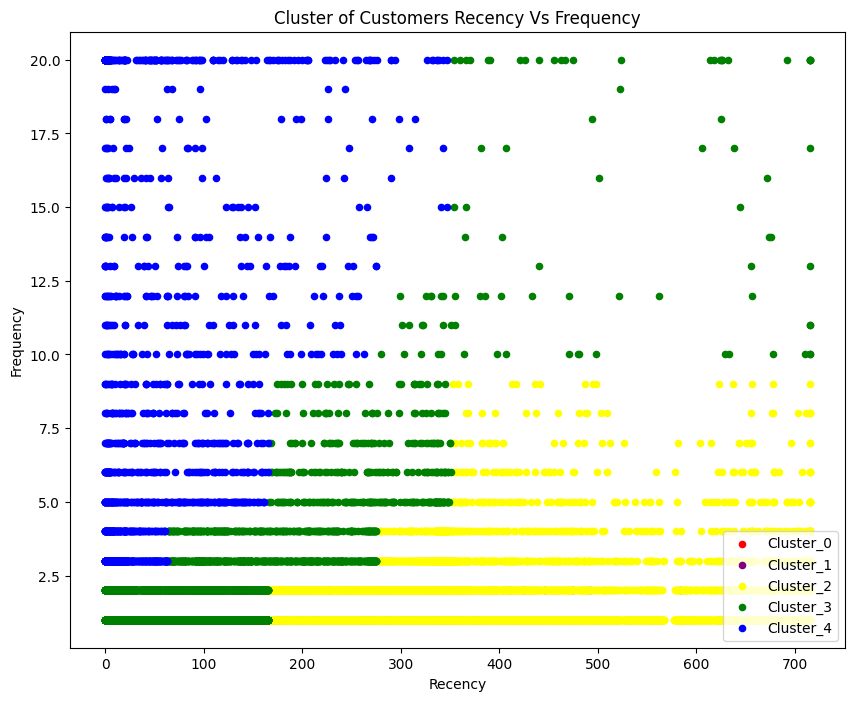

In [ ]:
plt.figure(figsize=(10,8))
for i in range(5):
    plt.scatter(useful_cluster_data[useful_cluster_data.RFM_class == i].Recency, 
                useful_cluster_data[useful_cluster_data.RFM_class == i].Frequency, 
                s=20, c=DISCRETE_COLORS[i], label=f'Cluster_{i}')

plt.title('Cluster of Customers Recency Vs Frequency')
plt.xlabel('Recency')
plt.ylabel('Frequency')
plt.legend(loc='lower right')

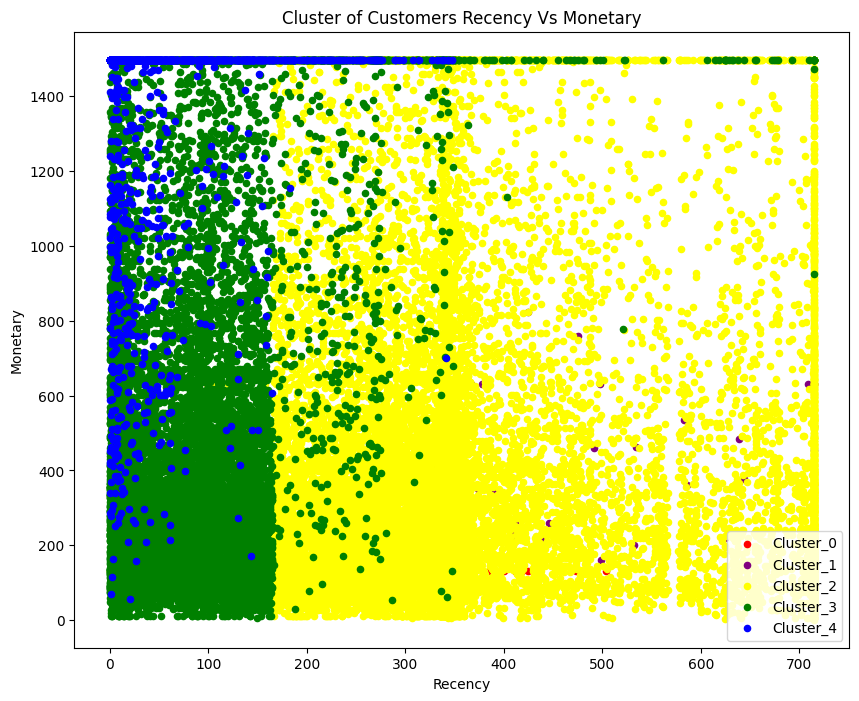

In [ ]:
plt.figure(figsize=(10,8))
for i in range(5):
    plt.scatter(useful_cluster_data[useful_cluster_data.RFM_class == i].Recency, 
                useful_cluster_data[useful_cluster_data.RFM_class == i].Monetary, 
                s=20, c=DISCRETE_COLORS[i], label=f'Cluster_{i}')

plt.title('Cluster of Customers Recency Vs Monetary')
plt.xlabel('Recency')
plt.ylabel('Monetary')
plt.legend(loc='lower right')

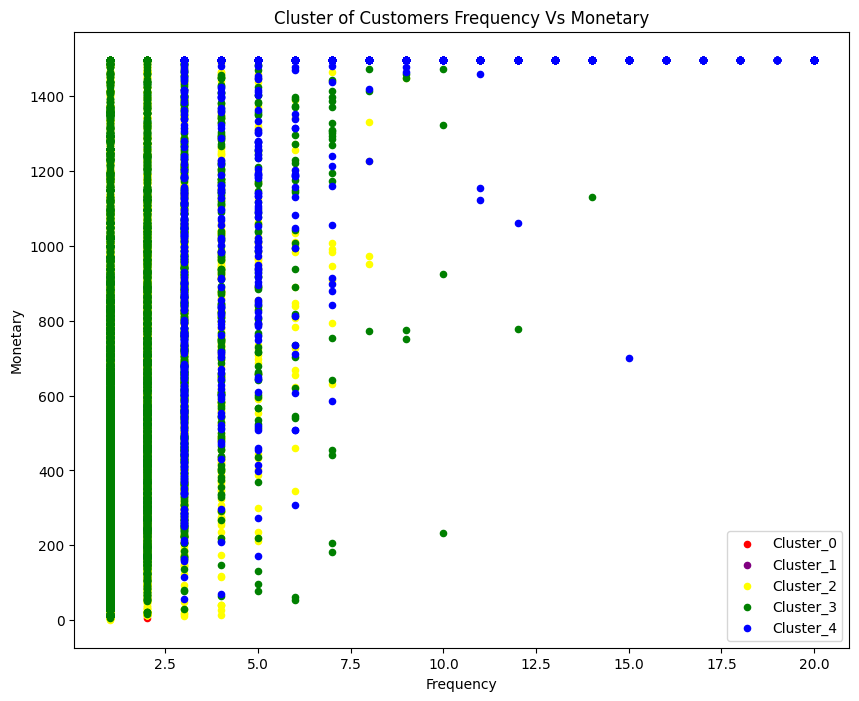

In [ ]:
plt.figure(figsize=(10,8))
for i in range(5):
    plt.scatter(useful_cluster_data[useful_cluster_data.RFM_class == i].Frequency, 
                useful_cluster_data[useful_cluster_data.RFM_class == i].Monetary, 
                s=20, c=DISCRETE_COLORS[i], label=f'Cluster_{i}')

plt.title('Cluster of Customers Frequency Vs Monetary')
plt.xlabel('Frequency')
plt.ylabel('Monetary')
plt.legend(loc='lower right')

# Comparing Relationships Among Component Variables

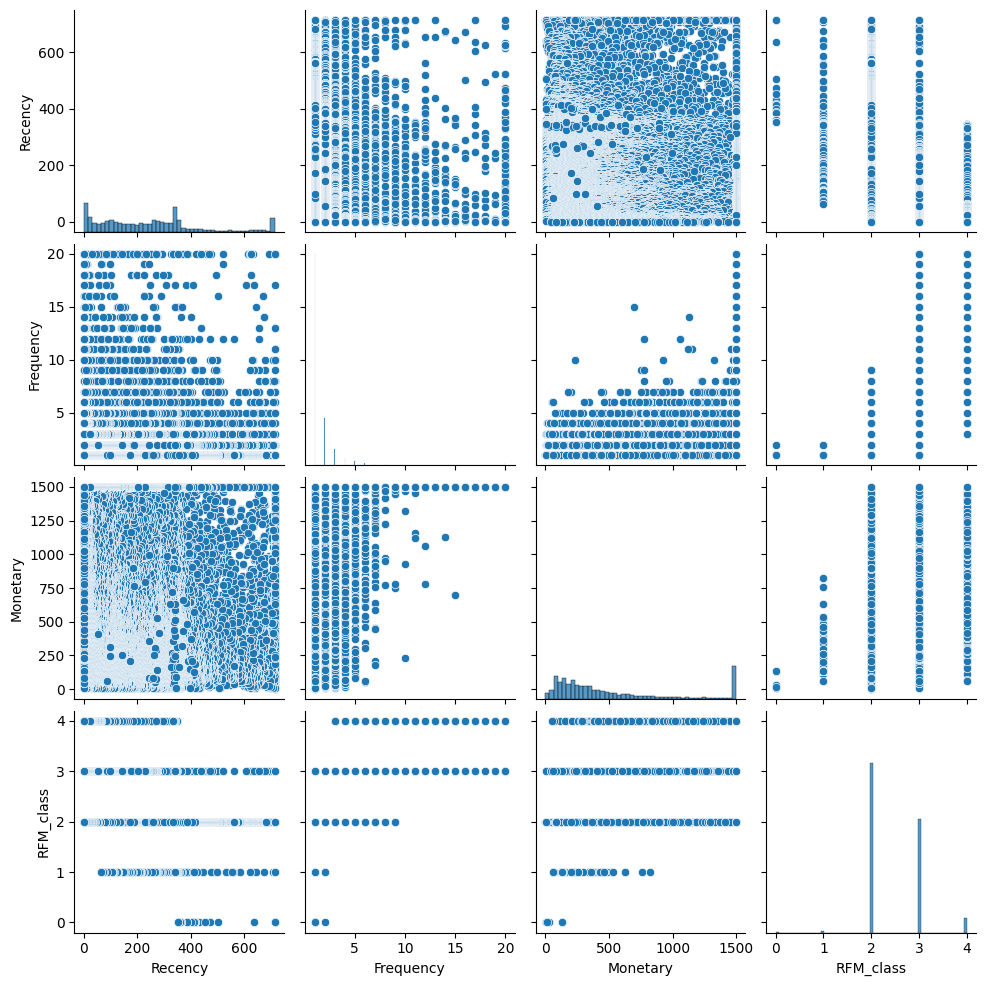

In [ ]:
sns.pairplot(useful_cluster_data.iloc[:,1:])

In [ ]:
useful_cluster_data.corr()

<ipython-input-142-24b23f560b77>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,Recency,Frequency,Monetary,RFM_class
Recency,1.000000,-0.059674,-0.068624,-0.698125
Frequency,-0.059674,1.000000,0.511900,0.407528
Monetary,-0.068624,0.511900,1.000000,0.317686
RFM_class,-0.698125,0.407528,0.317686,1.000000


<ipython-input-143-0a27e67f7cbb>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

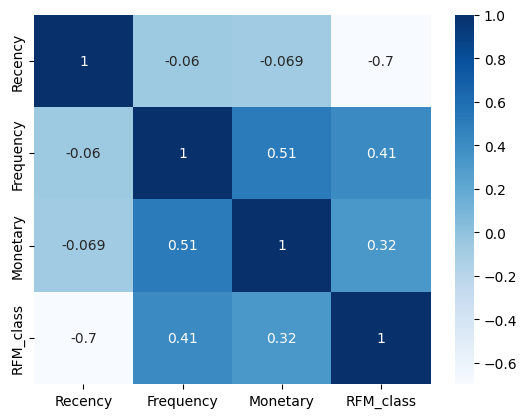

In [ ]:
sns.heatmap(useful_cluster_data.corr(), annot=True, cmap='Blues')

# Scaling the Dataset

using Standard Scaler

In [ ]:
# from sklearn.preprocessing import StandardScaler
X = useful_cluster_data.drop(columns=['user_id','RFM_class'])

scaler = MinMaxScaler()
sc_X = scaler.fit_transform(X)
sc_X

array([[0.72867133, 0.        , 0.18140626],
       [0.07832168, 0.15789474, 1.        ],
       [0.14405594, 0.15789474, 1.        ],
       ...,
       [0.28111888, 0.10526316, 1.        ],
       [0.53986014, 0.05263158, 0.32144409],
       [0.46433566, 0.10526316, 0.5986861 ]])

In [ ]:
# Converting scaled data into dataframe
scaled_X = pd.DataFrame(sc_X, columns=X.columns, index=X.index)
scaled_X.head()

,Recency,Frequency,Monetary
0,0.728671,0.000000,0.181406
1,0.078322,0.157895,1.000000
2,0.144056,0.157895,1.000000
3,0.188811,0.000000,0.086192
4,0.609790,0.263158,1.000000


In [ ]:
print(f'Shape of scaled_X data: {scaled_X.shape}')

Shape of scaled_X data: (31079, 3)


# Clustering using K-Means

### finding optimal cluster-size using elbow method 
plotting the wcss (Within Cluster Sum of Squares) against each cluster size to find k value at which there is no significant imporovement.

Text(0, 0.5, 'WCSS')

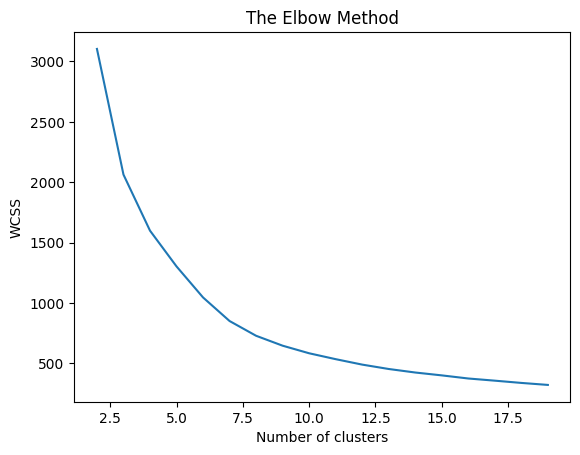

In [ ]:
# Using the elbow method to find the optimal number of clusters (k-value)

WCSS = []
for i in range(2,  20):
    kmeans = KMeans(n_clusters = i, init = "k-means++", random_state = 50, n_init=10)
    kmeans.fit(scaled_X.values)
    WCSS.append(kmeans.inertia_)
    
plt.plot(range(2, 20), WCSS)
plt.title("The Elbow Method")
plt.xlabel("Number of clusters")
plt.ylabel("WCSS")

From the graph, k=5 seems the best k value at which there is no longer a significant improvement on more splitting

### Using K-Means at k = 5 (no of clusters)

In [ ]:
K = 5

In [ ]:
kmeans5 = KMeans(n_clusters=K, init="k-means++", random_state=50, n_init=10)
y_kmeans5 = kmeans5.fit_predict(scaled_X)
y_kmeans5

array([2, 3, 3, ..., 3, 4, 1], dtype=int32)

In [ ]:
scaled_X.head()

,Recency,Frequency,Monetary
0,0.728671,0.000000,0.181406
1,0.078322,0.157895,1.000000
2,0.144056,0.157895,1.000000
3,0.188811,0.000000,0.086192
4,0.609790,0.263158,1.000000


The number of dimensions (3) invloved makes it impossible to visualize, hence the need for a dimeonsionality reduction techniques like PCA

# Dimensionality Reduction (using Principal Component Analysis, PCA)

3 columns seems too much dimension to plot, therefore we are using PCA for dimensionality reduction from 3D into 2D

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2, random_state=50)
reduced_scaled_X = pca.fit_transform(scaled_X)
reduced_scaled_X

array([[-0.23456723,  0.35343789],
       [ 0.70463899, -0.13037111],
       [ 0.69242399, -0.06578584],
       ...,
       [ 0.65491673,  0.0671822 ],
       [-0.05362471,  0.19529973],
       [ 0.23737783,  0.17362222]])

In [ ]:
pca.explained_variance_ratio_

array([0.55829088, 0.37965242])

In [ ]:
print(f'Explained Variance: {sum(pca.explained_variance_ratio_)}')

Explained Variance: 0.9379432935553396


Over 94% of the original variance is explained by the 2 new dimensions produced. 

### Visualizing Clusters

In [ ]:
# colors = plt.colormaps()[:k]

COLORS = [
    'red','green','blue','yellow','brown','pink','silver','black',
    'tomato', 'grey','indigo','violet','blue','purple','green','blue',
    'cyan','brown','orange','pink','gold'
]


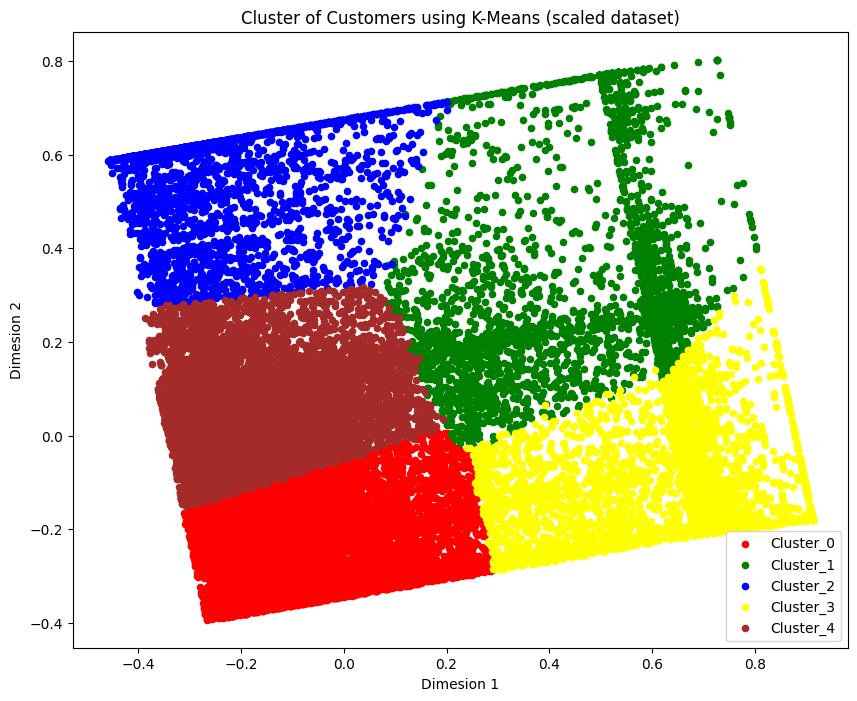

In [ ]:
plt.figure(figsize=(10,8))
for i in range(K):
    plt.scatter(reduced_scaled_X[y_kmeans5 == i, 0], reduced_scaled_X[y_kmeans5 == i, 1], 
                s=20, c=COLORS[i], label=f'Cluster_{i}')

plt.title('Cluster of Customers using K-Means (scaled dataset)')
plt.xlabel('Dimesion 1')
plt.ylabel('Dimesion 2')
plt.legend(loc='lower right')

In [ ]:
# Alternatively

reduced_scaled_X_df = pd.DataFrame(reduced_scaled_X, columns=['x1','x2'])
reduced_scaled_X_df['clusters'] = y_kmeans5
reduced_scaled_X_df.head()

,x1,x2,clusters
0,-0.234567,0.353438,2
1,0.704639,-0.130371,3
2,0.692424,-0.065786,3
3,-0.225234,-0.194442,0
4,0.629955,0.395206,1


Text(0.5, 1.0, 'Cluster of Customers based on Scaled RFM Components')

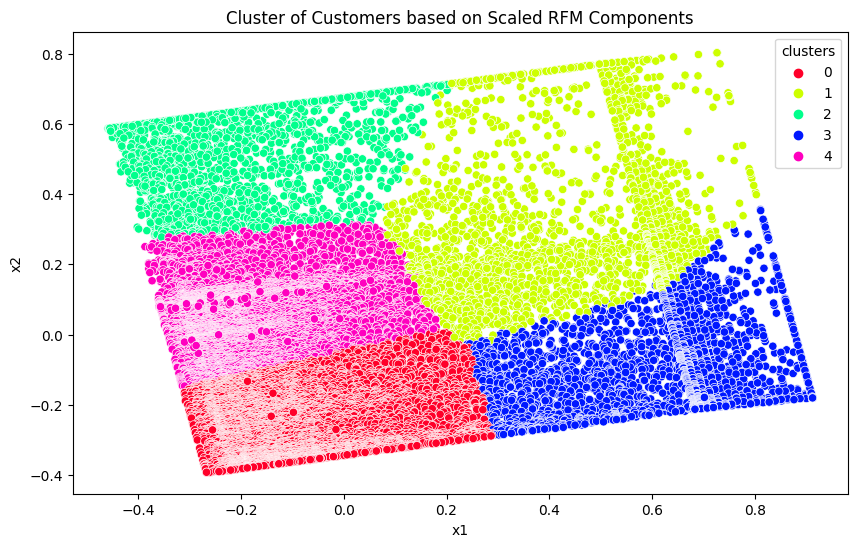

In [ ]:
plt.figure(figsize=(10,6))
sns.scatterplot(data=reduced_scaled_X_df, x='x1', y='x2', hue='clusters', palette='gist_rainbow' )
plt.title('Cluster of Customers based on Scaled RFM Components')

In [ ]:
plotly.scatter(data_frame=reduced_scaled_X_df, x='x1', y='x2', color='clusters')

In [ ]:
# plt.colormaps()

### Fitting K-Means on the reduced dimensions of the dataset to compare results of KMeans

In [ ]:
kmeans5_rdim = KMeans(n_clusters=K, init="k-means++", random_state=50, n_init=10)
y_kmeans5_rdim = kmeans5_rdim.fit_predict(reduced_scaled_X)
y_kmeans5_rdim

array([0, 1, 1, ..., 1, 3, 4], dtype=int32)

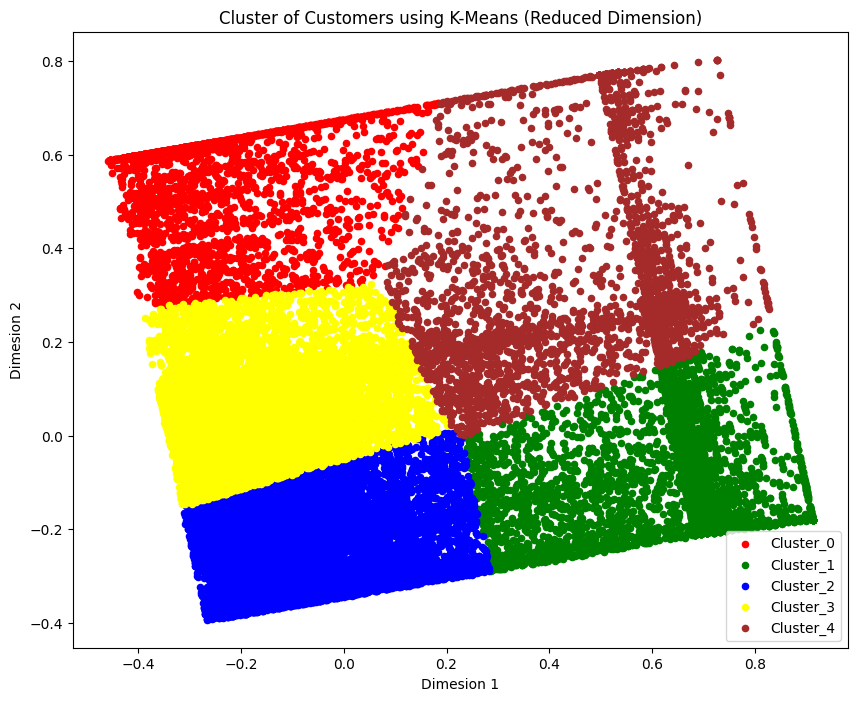

In [ ]:
# Ploting

plt.figure(figsize=(10,8))
for i in range(K):
    plt.scatter(reduced_scaled_X[y_kmeans5_rdim == i, 0], reduced_scaled_X[y_kmeans5_rdim == i, 1], 
                s=20, c=COLORS[i], label=f'Cluster_{i}')

plt.title('Cluster of Customers using K-Means (Reduced Dimension)')
plt.xlabel('Dimesion 1')
plt.ylabel('Dimesion 2')
plt.legend(loc='lower right')

### Comparing The Performances of the two KMeans Clustering Models on the dataset

In [ ]:
kmeans5.inertia_

1303.3500150792154

In [ ]:
kmeans5_rdim.inertia_

967.9733954885214

As observed above,
There is a significant improvement of about 336, between fitting KMeans on the 3D and reduced 2D dataset.

In [ ]:
useful_cluster_data['kmeans_clusters'] = y_kmeans5_rdim

<ipython-input-164-b25f7412c416>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
useful_cluster_data.head()

,user_id,Recency,Frequency,Monetary,RFM_class,kmeans_clusters
0,1.3135543336100173e+18,521,1,272.47,2,0
1,1.3135555415863468e+18,56,4,1497.34,4,1
2,1.313565915903689e+18,103,4,1497.34,3,1
3,1.313582215799505e+18,135,1,130.00,1,2
4,1.3135910334428618e+18,436,6,1497.34,2,4


In [ ]:
useful_cluster_data.tail()

,user_id,Recency,Frequency,Monetary,RFM_class,kmeans_clusters
31074,1.5506129490794255e+18,0,20,1497.34,4,1
31075,1.5524326559648328e+18,97,1,246.44,3,2
31076,1.5536344341697004e+18,201,3,1497.34,3,1
31077,1.5542306197460751e+18,386,2,482.01,2,3
31078,1.5542968554314793e+18,332,3,896.85,2,4


## Seeking to understand K-Means Clusters using our custom clusters as a guide

### Cluster 0

In [ ]:
# Cluster 0
cluster0 = useful_cluster_data[useful_cluster_data.kmeans_clusters == 0]
cluster0

,user_id,Recency,Frequency,Monetary,RFM_class,kmeans_clusters
0,1.3135543336100173e+18,521,1,272.47,2,0
5,1.3135965984789635e+18,703,2,23.98,2,0
14,1.313724432660825e+18,682,2,499.72,2,0
22,1.313835407502214e+18,715,1,915.23,2,0
25,1.313895557328012e+18,715,1,136.95,2,0
...,...,...,...,...,...,...
30991,1.5252308964608576e+18,715,1,230.85,2,0
31065,1.5377211730878802e+18,715,1,629.86,2,0
31066,1.5406320166077737e+18,715,1,253.29,2,0
31068,1.5422311219771482e+18,715,1,237.78,2,0


In [ ]:
print('Cluster 0 Analysis')
print('-'*20)
print(f'Recency: \t (Min - {cluster0.Recency.min()}, \t Max - {cluster0.Recency.max()})')
print(f'Frequency: \t (Min - {cluster0.Frequency.min()} \t Max - {cluster0.Frequency.max()})')
print(f'Monetary: \t (Min - {cluster0.Monetary.min()} \t Max - {cluster0.Monetary.max()})')
print(f'Value Counts: \n{cluster0.RFM_class.value_counts()}')

Cluster 0 Analysis
--------------------
Recency: 	 (Min - 465, 	 Max - 715)
Frequency: 	 (Min - 1 	 Max - 7)
Monetary: 	 (Min - 1.03 	 Max - 993.01)
Value Counts: 
2    2629
1      22
0       7
Name: RFM_class, dtype: int64


**Cluster 0 are moderately-valued customers**

### Cluster 1

In [ ]:
# Cluster 1
cluster1 = useful_cluster_data[useful_cluster_data.kmeans_clusters == 1]
cluster1

,user_id,Recency,Frequency,Monetary,RFM_class,kmeans_clusters
1,1.3135555415863468e+18,56,4,1497.34,4,1
2,1.313565915903689e+18,103,4,1497.34,3,1
6,1.3136054893297016e+18,99,10,1497.34,4,1
9,1.3136433261796398e+18,20,4,1497.34,4,1
11,1.3136581648889946e+18,57,7,1497.34,4,1
...,...,...,...,...,...,...
31016,1.5285291229454019e+18,184,2,899.31,2,1
31048,1.5288128026663987e+18,230,4,1497.34,3,1
31072,1.5470498162849882e+18,178,4,1166.44,3,1
31074,1.5506129490794255e+18,0,20,1497.34,4,1


In [ ]:
print('Cluster 1 Analysis')
print('-'*20)
print(f'Recency: \t (Min - {cluster1.Recency.min()}, \t Max - {cluster1.Recency.max()})')
print(f'Frequency: \t (Min - {cluster1.Frequency.min()} \t Max - {cluster1.Frequency.max()})')
print(f'Monetary: \t (Min - {cluster1.Monetary.min()} \t Max - {cluster1.Monetary.max()})')
print(f'Value Counts: \n{cluster1.RFM_class.value_counts()}')

Cluster 1 Analysis
--------------------
Recency: 	 (Min - 0, 	 Max - 298)
Frequency: 	 (Min - 1 	 Max - 20)
Monetary: 	 (Min - 810.14 	 Max - 1497.34)
Value Counts: 
3    2161
4    1283
2     348
Name: RFM_class, dtype: int64


**Cluster 1 are valued customers**

### Cluster 2

In [ ]:
# Cluster 2
cluster2 = useful_cluster_data[useful_cluster_data.kmeans_clusters == 2]
cluster2

,user_id,Recency,Frequency,Monetary,RFM_class,kmeans_clusters
3,1.313582215799505e+18,135,1,130.00,1,2
10,1.3136521738709898e+18,38,1,238.86,3,2
20,1.3138170768921728e+18,91,2,657.26,3,2
21,1.3138209616145943e+18,32,1,198.49,3,2
28,1.3139377873255142e+18,127,3,369.45,3,2
...,...,...,...,...,...,...
31026,1.5285979878806e+18,188,2,766.85,2,2
31034,1.5286357298386048e+18,54,2,407.22,3,2
31038,1.5286821023907843e+18,173,1,205.34,2,2
31057,1.528845139693274e+18,85,1,62.88,3,2


In [ ]:
print('Cluster 2 Analysis')
print('-'*20)
print(f'Recency: \t (Min - {cluster2.Recency.min()}, \t Max - {cluster2.Recency.max()})')
print(f'Frequency: \t (Min - {cluster2.Frequency.min()} \t Max - {cluster2.Frequency.max()})')
print(f'Monetary: \t (Min - {cluster2.Monetary.min()} \t Max - {cluster2.Monetary.max()})')
print(f'Value Counts: \n{cluster2.RFM_class.value_counts()}')

Cluster 2 Analysis
--------------------
Recency: 	 (Min - 0, 	 Max - 220)
Frequency: 	 (Min - 1 	 Max - 7)
Monetary: 	 (Min - 6.71 	 Max - 872.72)
Value Counts: 
3    9187
2    1119
4     177
1      40
Name: RFM_class, dtype: int64


**Cluster 2 are normal customers**

### Cluster 3

In [ ]:
# Cluster 3
cluster3 = useful_cluster_data[useful_cluster_data.kmeans_clusters == 3]
cluster3

,user_id,Recency,Frequency,Monetary,RFM_class,kmeans_clusters
7,1.3136117717176166e+18,302,1,480.14,2,3
12,1.3136894357741245e+18,389,5,442.93,2,3
16,1.3137401482062072e+18,467,1,512.19,2,3
18,1.3137554887640353e+18,382,1,636.31,2,3
33,1.3142445503146893e+18,366,1,83.42,2,3
...,...,...,...,...,...,...
31061,1.5308254880527818e+18,400,1,219.04,2,3
31062,1.5319279172132547e+18,340,2,246.30,2,3
31064,1.536833468174959e+18,400,1,369.73,2,3
31071,1.5459043592865057e+18,404,1,205.34,2,3


In [ ]:
print('Cluster 3 Analysis')
print('-'*20)
print(f'Recency: \t (Min - {cluster3.Recency.min()}, \t Max - {cluster3.Recency.max()})')
print(f'Frequency: \t (Min - {cluster3.Frequency.min()} \t Max - {cluster3.Frequency.max()})')
print(f'Monetary: \t (Min - {cluster3.Monetary.min()} \t Max - {cluster3.Monetary.max()})')
print(f'Value Counts: \n{cluster3.RFM_class.value_counts()}')

Cluster 3 Analysis
--------------------
Recency: 	 (Min - 179, 	 Max - 482)
Frequency: 	 (Min - 1 	 Max - 10)
Monetary: 	 (Min - 6.71 	 Max - 835.48)
Value Counts: 
2    11138
3      127
1       85
0       17
Name: RFM_class, dtype: int64


**Cluster 3 are moderate customers**

### Cluster 4

In [ ]:
# Cluster 4
cluster4 = useful_cluster_data[useful_cluster_data.kmeans_clusters == 4]
cluster4

,user_id,Recency,Frequency,Monetary,RFM_class,kmeans_clusters
4,1.3135910334428618e+18,436,6,1497.34,2,4
8,1.3136343076794537e+18,715,3,1345.74,2,4
13,1.3137147436927557e+18,715,5,1497.34,2,4
15,1.3137303645307535e+18,425,1,824.56,2,4
17,1.3137533189163592e+18,715,20,1497.34,3,4
...,...,...,...,...,...,...
31063,1.5346735332070523e+18,715,1,1497.34,2,4
31067,1.5412352418200947e+18,440,20,1497.34,3,4
31070,1.5451189481465446e+18,715,1,1410.68,2,4
31073,1.548075485387293e+18,340,2,1497.34,2,4


In [ ]:
print('Cluster 4 Analysis')
print('-'*20)
print(f'Recency: \t (Min - {cluster4.Recency.min()}, \t Max - {cluster4.Recency.max()})')
print(f'Frequency: \t (Min - {cluster4.Frequency.min()} \t Max - {cluster4.Frequency.max()})')
print(f'Monetary: \t (Min - {cluster4.Monetary.min()} \t Max - {cluster4.Monetary.max()})')
print(f'Value Counts: \n{cluster4.RFM_class.value_counts()}')

Cluster 4 Analysis
--------------------
Recency: 	 (Min - 210, 	 Max - 715)
Frequency: 	 (Min - 1 	 Max - 20)
Monetary: 	 (Min - 668.52 	 Max - 1497.34)
Value Counts: 
2    2394
3     330
4      13
1       2
Name: RFM_class, dtype: int64


**Cluster 4 are high-valued customers**

In [ ]:
useful_cluster_data.head()

,user_id,Recency,Frequency,Monetary,RFM_class,kmeans_clusters
0,1.3135543336100173e+18,521,1,272.47,2,0
1,1.3135555415863468e+18,56,4,1497.34,4,1
2,1.313565915903689e+18,103,4,1497.34,3,1
3,1.313582215799505e+18,135,1,130.00,1,2
4,1.3135910334428618e+18,436,6,1497.34,2,4


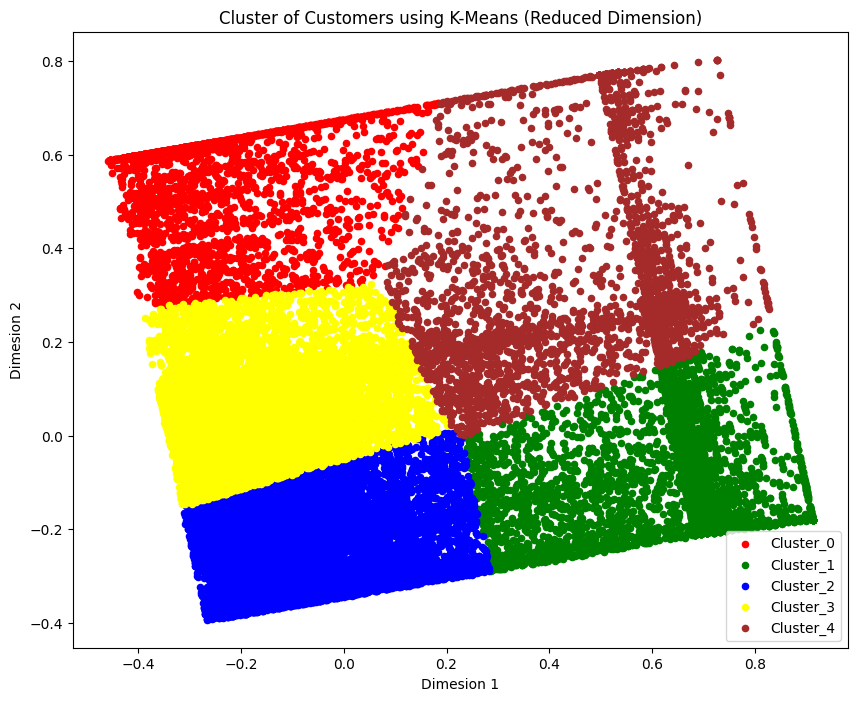

In [ ]:
# Ploting

plt.figure(figsize=(10,8))
for i in range(K):
    plt.scatter(reduced_scaled_X[y_kmeans5_rdim == i, 0], reduced_scaled_X[y_kmeans5_rdim == i, 1], 
                s=20, c=COLORS[i], label=f'Cluster_{i}')

plt.title('Cluster of Customers using K-Means (Reduced Dimension)')
plt.xlabel('Dimesion 1')
plt.ylabel('Dimesion 2')
plt.legend(loc='lower right')

In [ ]:
# Recoding class-label codes for Interpretability of Results

RECODED_CLASS = {1:4, 4:3, 2:2, 0:1, 3:0}

useful_cluster_data.kmeans_clusters = useful_cluster_data.kmeans_clusters.map(RECODED_CLASS)

<ipython-input-179-d147e683c12c>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
data_summary.head()

,user_id,order_counts,recent_order_date_time,total_purchase_price,avg_purchases_price,Recency,Frequency,Monetary,R_score,F_score,M_score,RFM,RFM_class
0,1.3135543336100173e+18,1,2020-06-27 17:17:01,272.47,272.47,521,1,272.47,1,1,5,7,2
1,1.3135555415863468e+18,4,2021-10-05 12:56:23,3818.79,954.70,56,4,1497.34,5,2,5,12,4
2,1.313565915903689e+18,4,2021-08-19 18:12:29,2814.39,703.60,103,4,1497.34,4,2,5,11,3
3,1.313582215799505e+18,1,2021-07-19 06:49:07,130.00,130.00,135,1,130.00,4,1,1,6,1
4,1.3135910334428618e+18,6,2020-09-21 03:23:39,2067.09,344.52,436,6,1497.34,1,3,5,9,2


In [ ]:
useful_cluster_data = pd.concat(
    [useful_cluster_data, data_summary[['R_score', 'F_score', 'M_score']]], 
    axis='columns')
useful_cluster_data.head()

,user_id,Recency,Frequency,Monetary,RFM_class,kmeans_clusters,R_score,F_score,M_score
0,1.3135543336100173e+18,521,1,272.47,2,1,1,1,5
1,1.3135555415863468e+18,56,4,1497.34,4,4,5,2,5
2,1.313565915903689e+18,103,4,1497.34,3,4,4,2,5
3,1.313582215799505e+18,135,1,130.00,1,2,4,1,1
4,1.3135910334428618e+18,436,6,1497.34,2,3,1,3,5


In [ ]:
# Saving a copy of cleaned dataset
useful_cluster_data.to_csv(f'{RESULT_PATH}/CLEANED_CLUSTERED_DATASET.csv')

slim_cleaned = useful_cluster_data.drop(columns=['RFM_class'])

# Saving a copy of cleaned dataset slim
slim_cleaned.to_csv(f'{RESULT_PATH}/CLEANED_CLUSTERED_DATASET_SLIM.csv')



# Generating Key Table for Interpretability of Results

In [ ]:
label_keys = {
    'class_labels': [0, 1, 2, 3, 4],
    'levels': ['Level 1', 'Level 2', 'Level 3', 'Level 4', 'Level 5'],
    'customer_rank': ['Normal', 'Moderate', 'Valued', 'High-Valued', 'Extremely High-Valued']
}

LABEL_KEYS_DF = pd.DataFrame(label_keys)

# saving a copy of the label keys table
LABEL_KEYS_DF.to_csv(f'{MODEL_PATH}/LABEL_KEYS_TABLE.csv')

LABEL_KEYS_DF

,class_labels,levels,customer_rank
0,0,Level 1,Normal
1,1,Level 2,Moderate
2,2,Level 3,Valued
3,3,Level 4,High-Valued
4,4,Level 5,Extremely High-Valued


### Clustering using Hierachical Clustering Approach

In [ ]:
# from scipy.cluster import hierarchy as sch
# from sklearn.cluster import AgglomerativeClustering

In [ ]:
# # visualizaing dendogram


# plt.figure(figsize=(18,6))
# dendogram = sch.dendrogram(sch.linkage(reduced_scaled_X,method='ward', metric='euclidean'))

# plt.title('Dendogram')
# plt.xlabel('Customers')
# plt.ylabel('Euclidean Distances')

In [ ]:
# # Assigning clusters based on the cluster size observed from the dendogram above

# cluster_size = 7
# ac = AgglomerativeClustering(n_clusters=cluster_size, affinity='euclidean', linkage='ward')
# y_ac = ac.fit_predict(reduced_scaled_X)

In [ ]:
# # Visualizing clsuters

# plt.figure(figsize=(10,8))

# for i in range(y_ac.max()+1):
#     plt.scatter(reduced_scaled_X[y_ac == i, 0], reduced_scaled_X[y_ac == i, 1], 
#                 s=20, c=COLORS[i], label=f'Cluster_{i}')

# plt.title('Cluster of Customers, using Agglomerative Clustering')
# plt.xlabel('Dimension 1')
# plt.ylabel('Dimension 2')
# plt.legend(loc='lower right')

# Training Machine Learning Algorithms on scaled data and clusters

In [ ]:
cleaned_data = pd.concat([useful_cluster_data.user_id, scaled_X, useful_cluster_data.RFM_class, useful_cluster_data.kmeans_clusters], axis='columns')
cleaned_data.head()

,user_id,Recency,Frequency,Monetary,RFM_class,kmeans_clusters
0,1.3135543336100173e+18,0.728671,0.000000,0.181406,2,1
1,1.3135555415863468e+18,0.078322,0.157895,1.000000,4,4
2,1.313565915903689e+18,0.144056,0.157895,1.000000,3,4
3,1.313582215799505e+18,0.188811,0.000000,0.086192,1,2
4,1.3135910334428618e+18,0.609790,0.263158,1.000000,2,3


## Clustered Values

In [ ]:
cleaned_data.rename(columns={'kmeans_clusters':'cluster'}, inplace=True)
cleaned_data.head()

,user_id,Recency,Frequency,Monetary,RFM_class,cluster
0,1.3135543336100173e+18,0.728671,0.000000,0.181406,2,1
1,1.3135555415863468e+18,0.078322,0.157895,1.000000,4,4
2,1.313565915903689e+18,0.144056,0.157895,1.000000,3,4
3,1.313582215799505e+18,0.188811,0.000000,0.086192,1,2
4,1.3135910334428618e+18,0.609790,0.263158,1.000000,2,3


<Axes: xlabel='Recency', ylabel='Frequency'>

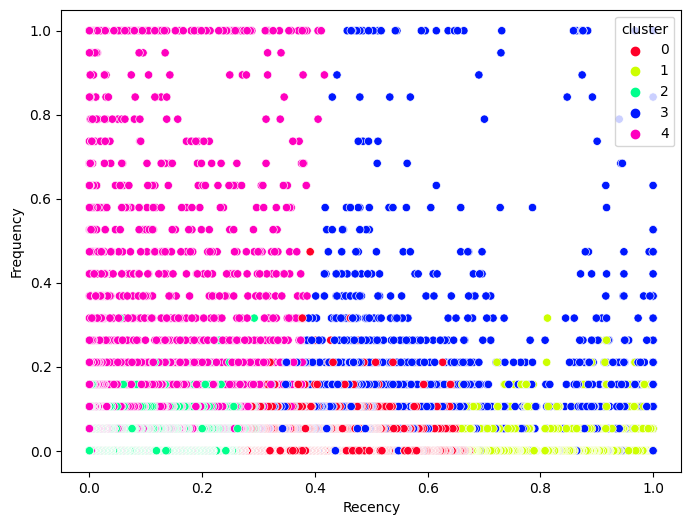

In [ ]:
plt.figure(figsize=(8,6))
sns.scatterplot(data=cleaned_data, x='Recency', y='Frequency', hue='cluster', palette='gist_rainbow' )

<Axes: xlabel='Recency', ylabel='Monetary'>

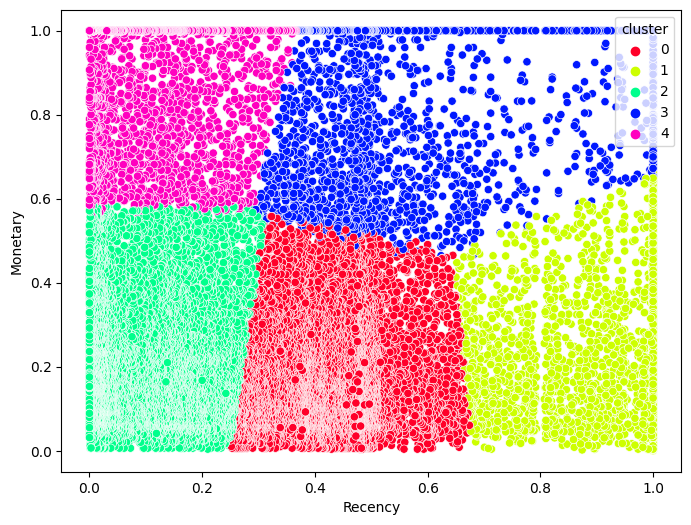

In [ ]:
plt.figure(figsize=(8,6))
sns.scatterplot(data=cleaned_data, x='Recency', y='Monetary', hue='cluster', palette='gist_rainbow' )

<Axes: xlabel='Frequency', ylabel='Monetary'>

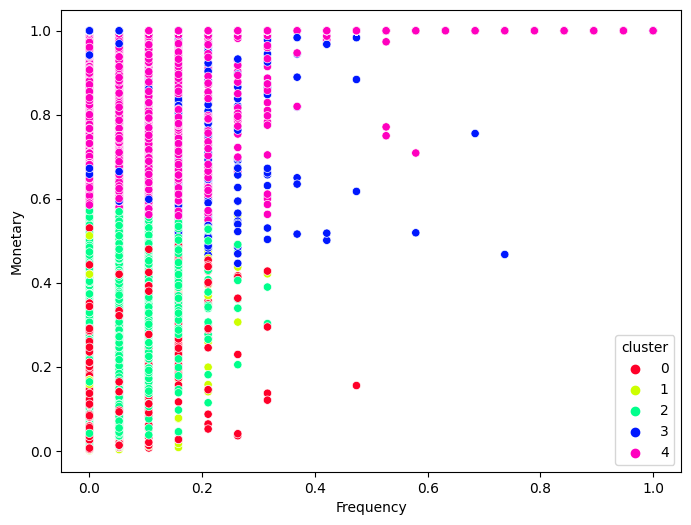

In [ ]:
plt.figure(figsize=(8,6))
sns.scatterplot(data=cleaned_data, x='Frequency', y='Monetary', hue='cluster', palette='gist_rainbow' )

## Scored class Values

In [ ]:
cleaned_data.head()

,user_id,Recency,Frequency,Monetary,RFM_class,cluster
0,1.3135543336100173e+18,0.728671,0.000000,0.181406,2,1
1,1.3135555415863468e+18,0.078322,0.157895,1.000000,4,4
2,1.313565915903689e+18,0.144056,0.157895,1.000000,3,4
3,1.313582215799505e+18,0.188811,0.000000,0.086192,1,2
4,1.3135910334428618e+18,0.609790,0.263158,1.000000,2,3


<Axes: xlabel='Recency', ylabel='Frequency'>

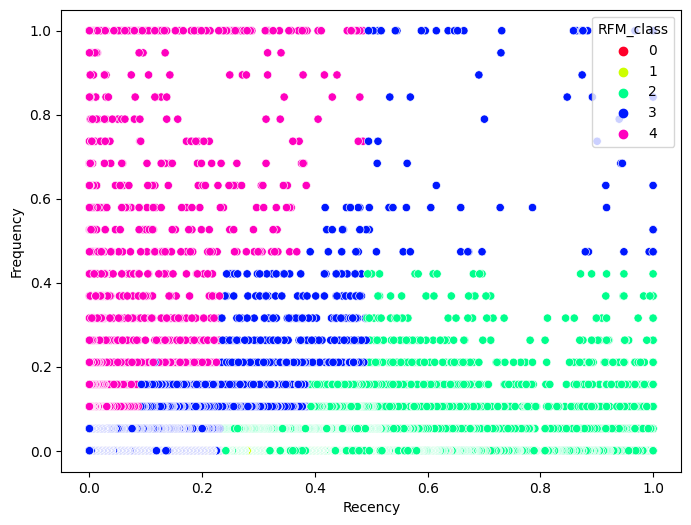

In [ ]:
plt.figure(figsize=(8,6))
sns.scatterplot(data=cleaned_data, x='Recency', y='Frequency', hue='RFM_class', palette='gist_rainbow' )

<Axes: xlabel='Recency', ylabel='Monetary'>

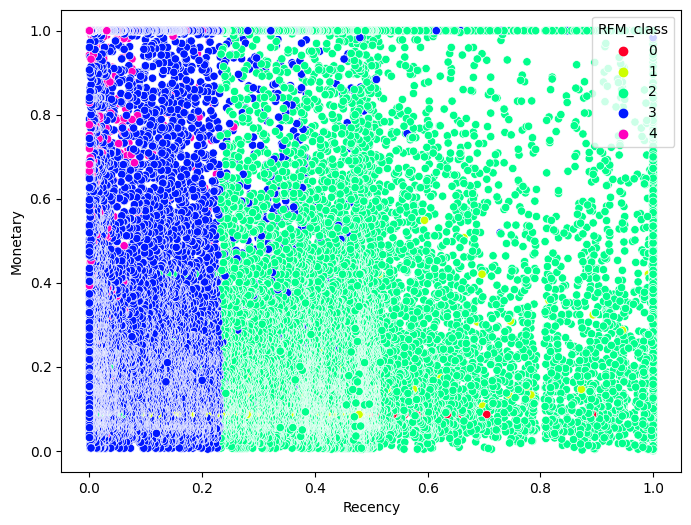

In [ ]:
plt.figure(figsize=(8,6))
sns.scatterplot(data=cleaned_data, x='Recency', y='Monetary', hue='RFM_class', palette='gist_rainbow' )

<Axes: xlabel='Frequency', ylabel='Monetary'>

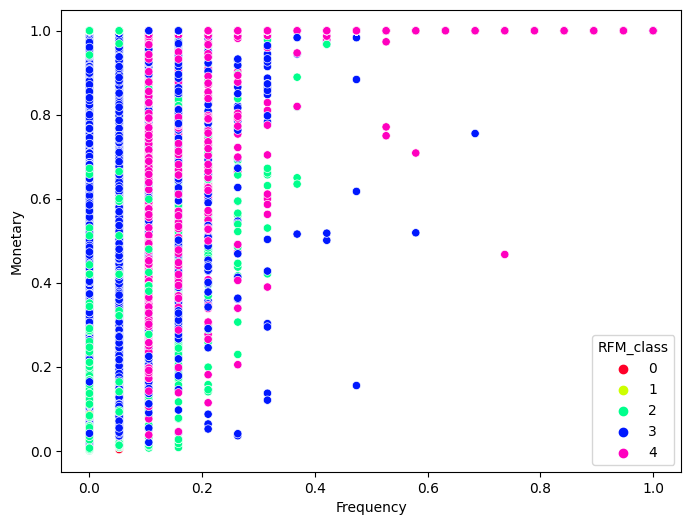

In [ ]:
plt.figure(figsize=(8,6))
sns.scatterplot(data=cleaned_data, x='Frequency', y='Monetary', hue='RFM_class', palette='gist_rainbow' )

In [ ]:
cleaned_data.shape

(31079, 6)

## Data Segmentation

In [ ]:
cleaned_data.head()

,user_id,Recency,Frequency,Monetary,RFM_class,cluster
0,1.3135543336100173e+18,0.728671,0.000000,0.181406,2,1
1,1.3135555415863468e+18,0.078322,0.157895,1.000000,4,4
2,1.313565915903689e+18,0.144056,0.157895,1.000000,3,4
3,1.313582215799505e+18,0.188811,0.000000,0.086192,1,2
4,1.3135910334428618e+18,0.609790,0.263158,1.000000,2,3


In [ ]:
X = cleaned_data.drop(columns=['user_id', 'cluster', 'RFM_class'])
y = cleaned_data.RFM_class

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [ ]:
print(f'Shape of X_train: {X_train.shape}')
print(f'Shape of X_test: {X_test.shape}')

Shape of X_train: (21755, 3)
Shape of X_test: (9324, 3)


In [ ]:
X_train.head()

,Recency,Frequency,Monetary
5719,0.860140,0.0,0.773837
902,1.000000,0.0,0.296757
6501,0.671329,0.0,0.231757
8192,0.542657,0.0,0.090770
20924,0.253147,0.0,0.326049


In [ ]:
y_train.head()

5719     2
902      2
6501     2
8192     2
20924    2
Name: RFM_class, dtype: int64

In [ ]:
X_test.head()

,Recency,Frequency,Monetary
8398,0.478322,0.052632,0.600049
2622,0.026573,0.578947,1.000000
15953,0.223776,0.105263,0.428407
13754,0.422378,0.000000,0.145698
12610,0.360839,0.000000,0.141120


In [ ]:
y_test.head()

8398     2
2622     4
15953    3
13754    2
12610    2
Name: RFM_class, dtype: int64

# Evaluation metrics

In [ ]:
# Evaluation metrics

EVAL_METRICS = ['accuracy', 'precision', 'recall']

In [ ]:
# Saving a copy of the X_test
data_summary.iloc[X_test.index].to_csv(f'{DATASET_PATH}/X_test.csv')

## Naive Baye's

In [ ]:
# instantiation
nb = GaussianNB()

In [ ]:
# Training 
nb.fit(X_train, y_train)

GaussianNB()

In [ ]:
# predictions
nb_pred = nb.predict(X_test)

In [ ]:
pd.DataFrame(zip(useful_cluster_data.user_id.values, y_test, nb_pred), columns=['user_id','actual', 'nb_predictions'], index=X_test.index)

,user_id,actual,nb_predictions
8398,1.3135543336100173e+18,2,2
2622,1.3135555415863468e+18,4,4
15953,1.313565915903689e+18,3,3
13754,1.313582215799505e+18,2,2
12610,1.3135910334428618e+18,2,2
...,...,...,...
25911,1.515915625547425e+18,4,4
12604,1.5159156255474342e+18,2,0
26991,1.5159156255474348e+18,3,3
14233,1.515915625547463e+18,2,2


In [ ]:
nb_predictions_samples = pd.DataFrame(nb_pred, columns=['nb_predictions'], index=X_test.index)
nb_predictions_samples.head()

,nb_predictions
8398,2
2622,4
15953,3
13754,2
12610,2


### Evaluations

In [ ]:
nb_pred[:5]

array([2, 4, 3, 2, 2])

In [ ]:
# Classification Report 
print(f"Classification Reports:\n {classification_report(y_test, nb_pred, zero_division=1)}")

Classification Reports:
               precision    recall  f1-score   support

           0       0.00      0.80      0.01        10
           1       1.00      0.00      0.00        41
           2       0.97      0.70      0.81      5284
           3       0.92      0.88      0.90      3511
           4       0.77      0.66      0.71       478

    accuracy                           0.76      9324
   macro avg       0.73      0.61      0.49      9324
weighted avg       0.94      0.76      0.84      9324



In [ ]:
# confusion matrix
cf = confusion_matrix(y_test, nb_pred)
pd.DataFrame(cf, index=list(range(5)), columns=list(range(5)))

,0,1,2,3,4
0,8,0,2,0,0
1,26,0,14,1,0
2,1481,0,3698,93,12
3,235,0,106,3088,82
4,0,0,0,164,314


Text(0.5, 1.0, "Naive Baye's (Baseline) Confusion Matrix")

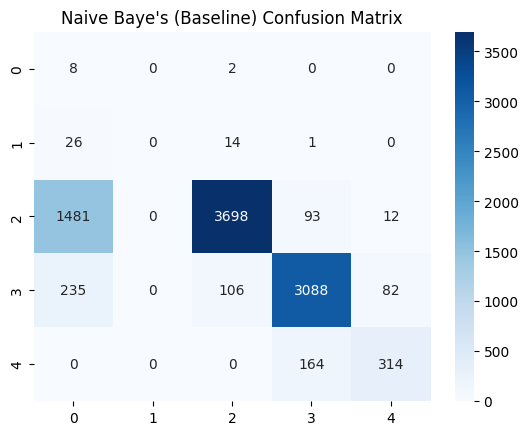

In [ ]:
sns.heatmap(cf, annot=True, cmap='Blues', fmt='.0f')
plt.title('Naive Baye\'s (Baseline) Confusion Matrix')

In [ ]:
# Evaluation
nb_evals = [
    np.round(accuracy_score(y_test, nb_pred), 5),
    np.round(precision_score(y_test, nb_pred, average='weighted'), 5),
    np.round(recall_score(y_test, nb_pred, average='weighted'), 5)
]

nb_results = pd.DataFrame(nb_evals, columns=['NB_baseline'], index=EVAL_METRICS)
nb_results

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,NB_baseline
accuracy,0.76233
precision,0.93559
recall,0.76233


Text(0, 0.5, 'Score')

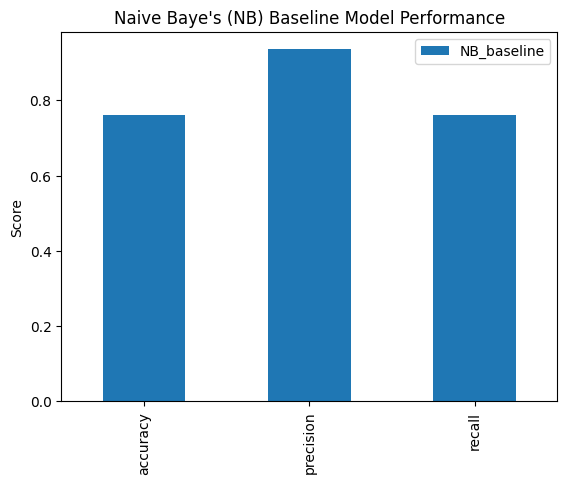

In [ ]:
nb_results.plot.bar(title='Naive Baye\'s (NB) Baseline Model Performance')
plt.ylabel('Score')

In [ ]:
plotly.bar(nb_results, title='Naive Baye\'s (NB) Baseline Model Performance')

# Support Vector Machine (SVM)

In [ ]:
# instantiation
svc = SVC(C=1.0, kernel='rbf', degree=3, gamma='scale', random_state=50, probability=True)

In [ ]:
# training
svc.fit(X_train, y_train)

SVC(probability=True, random_state=50)

In [ ]:
# predictions
svc_pred = svc.predict(X_test)

In [ ]:
pd.DataFrame(zip(useful_cluster_data.user_id.values, y_test, svc_pred), columns=['user_id','actual', 'svc_predictions'], index=X_test.index)

,user_id,actual,svc_predictions
8398,1.3135543336100173e+18,2,2
2622,1.3135555415863468e+18,4,4
15953,1.313565915903689e+18,3,3
13754,1.313582215799505e+18,2,2
12610,1.3135910334428618e+18,2,2
...,...,...,...
25911,1.515915625547425e+18,4,4
12604,1.5159156255474342e+18,2,2
26991,1.5159156255474348e+18,3,3
14233,1.515915625547463e+18,2,2


In [ ]:
svc_predictions_samples = pd.DataFrame(svc_pred, columns=['svc_predictions'], index=X_test.index)
svc_predictions_samples.head()

,svc_predictions
8398,2
2622,4
15953,3
13754,2
12610,2


### Evaluations

In [ ]:
svc_pred[:5]

array([2, 4, 3, 2, 2])

In [ ]:
# Classification Report 
print(f"Classification Reports:\n {classification_report(y_test, svc_pred, zero_division=1)}")

Classification Reports:
               precision    recall  f1-score   support

           0       1.00      0.00      0.00        10
           1       1.00      0.00      0.00        41
           2       0.98      0.98      0.98      5284
           3       0.96      0.97      0.97      3511
           4       0.96      0.92      0.94       478

    accuracy                           0.97      9324
   macro avg       0.98      0.57      0.58      9324
weighted avg       0.97      0.97      0.97      9324



In [ ]:
# confusion matrix
cf = confusion_matrix(y_test, svc_pred)
pd.DataFrame(cf, index=list(range(5)), columns=list(range(5)))

,0,1,2,3,4
0,0,0,10,0,0
1,0,0,30,11,0
2,0,0,5198,86,0
3,0,0,85,3410,16
4,0,0,0,39,439


Text(0.5, 1.0, 'SVM Confusion Matrix')

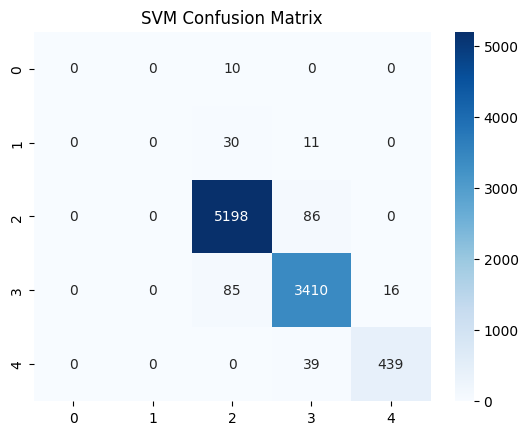

In [ ]:
sns.heatmap(cf, annot=True, cmap='Blues', fmt='.0f')
plt.title('SVM Confusion Matrix')

In [ ]:
# Evaluation
svc_evals = [
    np.round(accuracy_score(y_test, svc_pred), 5),
    np.round(precision_score(y_test, svc_pred, average='weighted'), 5),
    np.round(recall_score(y_test, svc_pred, average='weighted'), 5)
]

svc_results = pd.DataFrame(svc_evals, columns=['SVM'], index=EVAL_METRICS)
svc_results

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,SVM
accuracy,0.97029
precision,0.96498
recall,0.97029


Text(0, 0.5, 'Score')

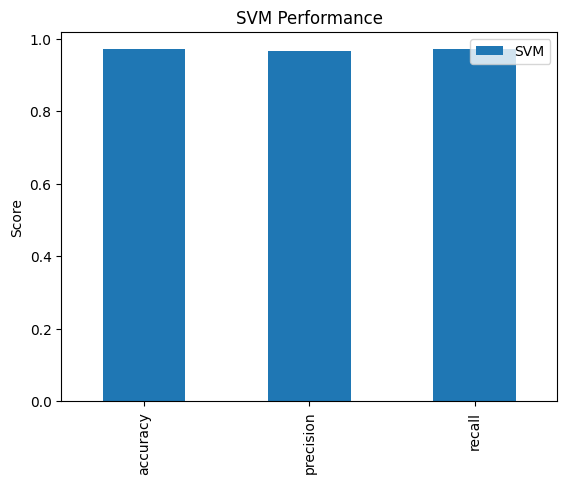

In [ ]:
svc_results.plot.bar(title='SVM Performance')
plt.ylabel('Score')

In [ ]:
plotly.bar(svc_results, title='SVM Performance')

# Random Forest

In [ ]:
# instantiation
rf = RandomForestClassifier(n_estimators=100, criterion='gini', random_state=50, 
                            min_samples_split=2, min_samples_leaf=1, bootstrap=True)

In [ ]:
# training
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=50)

In [ ]:
# predictions
rf_pred = rf.predict(X_test)

In [ ]:
pd.DataFrame(zip(useful_cluster_data.user_id.values, y_test, rf_pred), columns=['user_id','actual', 'rf_predictions'], index=X_test.index)

,user_id,actual,rf_predictions
8398,1.3135543336100173e+18,2,2
2622,1.3135555415863468e+18,4,4
15953,1.313565915903689e+18,3,3
13754,1.313582215799505e+18,2,2
12610,1.3135910334428618e+18,2,2
...,...,...,...
25911,1.515915625547425e+18,4,4
12604,1.5159156255474342e+18,2,2
26991,1.5159156255474348e+18,3,3
14233,1.515915625547463e+18,2,2


In [ ]:
rf_predictions_samples = pd.DataFrame(rf_pred, columns=['rf_predictions'], index=X_test.index)
rf_predictions_samples.head()

,rf_predictions
8398,2
2622,4
15953,3
13754,2
12610,2


### Evaluations

In [ ]:
rf_pred[:5]

array([2, 4, 3, 2, 2])

In [ ]:
# Classification Report 
print(f"Classification Reports:\n {classification_report(y_test, rf_pred, zero_division=1)}")

Classification Reports:
               precision    recall  f1-score   support

           0       1.00      0.70      0.82        10
           1       0.93      0.61      0.74        41
           2       1.00      1.00      1.00      5284
           3       1.00      1.00      1.00      3511
           4       1.00      1.00      1.00       478

    accuracy                           1.00      9324
   macro avg       0.98      0.86      0.91      9324
weighted avg       1.00      1.00      1.00      9324



In [ ]:
# confusion matrix
cf = confusion_matrix(y_test, rf_pred)
pd.DataFrame(cf, index=list(range(5)), columns=list(range(5)))

,0,1,2,3,4
0,7,1,2,0,0
1,0,25,15,1,0
2,0,1,5278,5,0
3,0,0,1,3510,0
4,0,0,0,1,477


Text(0.5, 1.0, 'Random Forest Confusion Matrix')

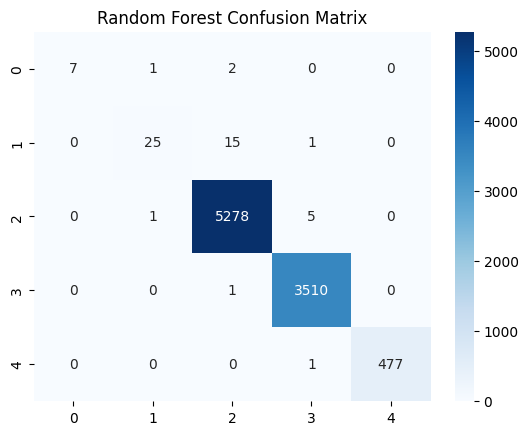

In [ ]:
sns.heatmap(cf, annot=True, cmap='Blues', fmt='.0f')
plt.title('Random Forest Confusion Matrix')

In [ ]:
# Evaluation
rf_evals = [
    np.round(accuracy_score(y_test, rf_pred), 5),
    np.round(precision_score(y_test, rf_pred, average='weighted'), 5),
    np.round(recall_score(y_test, rf_pred, average='weighted'), 5)
]

rf_results = pd.DataFrame(rf_evals, columns=['RF'], index=EVAL_METRICS)
rf_results

,RF
accuracy,0.9971
precision,0.9970
recall,0.9971


Text(0, 0.5, 'Score')

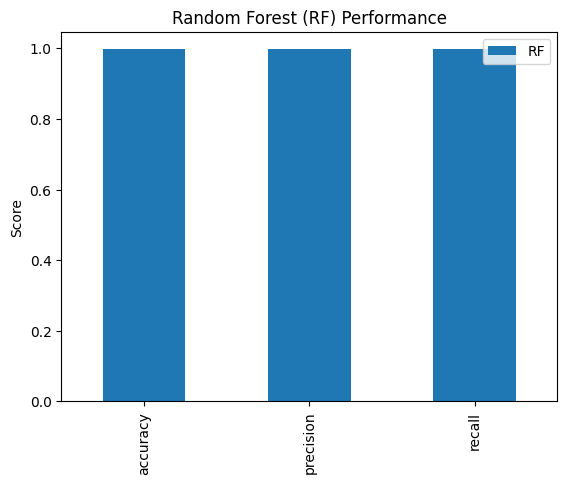

In [ ]:
rf_results.plot.bar(title='Random Forest (RF) Performance')
plt.ylabel('Score')

In [ ]:
plotly.bar(rf_results, title='Random Forest (RF) Performance')

# XGBoost

In [ ]:
# initialization
xgb = XGBClassifier(n_estimators=100, learning_rate=0.001, eval_metric='mlogloss', random_state=50)

In [ ]:
# Training
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.001, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob',
              predictor=None, ...)

In [ ]:
# Predictions
xgb_pred = xgb.predict(X_test)

In [ ]:
pd.DataFrame(zip(useful_cluster_data.user_id.values, y_test, xgb_pred), columns=['user_id','actual', 'xgb_predictions'], index=X_test.index)

,user_id,actual,xgb_predictions
8398,1.3135543336100173e+18,2,2
2622,1.3135555415863468e+18,4,4
15953,1.313565915903689e+18,3,3
13754,1.313582215799505e+18,2,2
12610,1.3135910334428618e+18,2,2
...,...,...,...
25911,1.515915625547425e+18,4,4
12604,1.5159156255474342e+18,2,2
26991,1.5159156255474348e+18,3,3
14233,1.515915625547463e+18,2,2


In [ ]:
xgb_predictions_samples = pd.DataFrame(xgb_pred, columns=['xgb_predictions'], index=X_test.index)
xgb_predictions_samples.head()

,xgb_predictions
8398,2
2622,4
15953,3
13754,2
12610,2


### Evaluations

In [ ]:
xgb_pred[:5]

array([2, 4, 3, 2, 2])

In [ ]:
# Classification Report 
print(f"Classification Reports:\n {classification_report(y_test, xgb_pred, zero_division=1)}")

Classification Reports:
               precision    recall  f1-score   support

           0       1.00      0.00      0.00        10
           1       1.00      0.00      0.00        41
           2       0.99      1.00      0.99      5284
           3       0.99      1.00      1.00      3511
           4       1.00      1.00      1.00       478

    accuracy                           0.99      9324
   macro avg       1.00      0.60      0.60      9324
weighted avg       0.99      0.99      0.99      9324



In [ ]:
# confusion matrix
cf = confusion_matrix(y_test, xgb_pred)
pd.DataFrame(cf, index=list(range(5)), columns=list(range(5)))

,0,1,2,3,4
0,0,0,10,0,0
1,0,0,30,11,0
2,0,0,5268,16,0
3,0,0,0,3509,2
4,0,0,0,0,478


Text(0.5, 1.0, 'XGB Confusion Matrix')

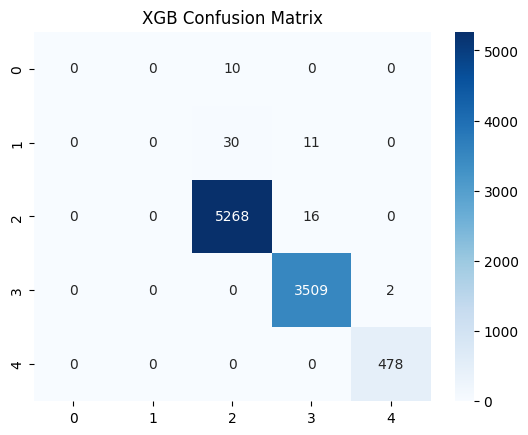

In [ ]:
sns.heatmap(cf, annot=True, cmap='Blues', fmt='.0f')
plt.title('XGB Confusion Matrix')

In [ ]:
# Evaluation
xgb_evals = [
    np.round(accuracy_score(y_test, xgb_pred), 5),
    np.round(precision_score(y_test, xgb_pred, average='weighted'), 5),
    np.round(recall_score(y_test, xgb_pred, average='weighted'), 5)
]

xgb_results = pd.DataFrame(xgb_evals, columns=['XGB'], index=EVAL_METRICS)
xgb_results

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,XGB
accuracy,0.99260
precision,0.98717
recall,0.99260


Text(0, 0.5, 'Score')

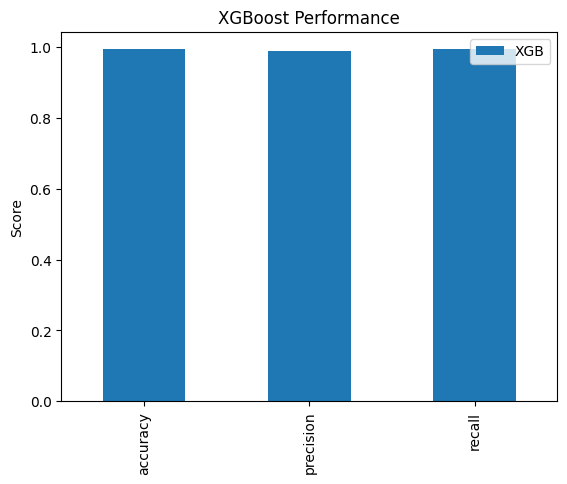

In [ ]:
xgb_results.plot.bar(title='XGBoost Performance')
plt.ylabel('Score')

In [ ]:
plotly.bar(xgb_results, title='XGBoost Performance')

# Artificial Neural Networks (ANN)

In [ ]:
# del nn

In [ ]:
EPOCHS = 100
BATCH_SIZE = 50

In [ ]:
#Initailizing the ANN
nn = Sequential()
out_node_dim = int((len(X_train.columns) + y_train.nunique()) / 2)
print(f'Output_Node_dimension: {out_node_dim}')

# Adding the first hidden layer and input layer
nn.add(Dense(units=out_node_dim, 
             activation='relu',
             kernel_initializer='uniform',
             input_shape=(len(X_train.columns),)
            ))


# Adding the SECOND HIDDEN LAYER
nn.add(Dense(units=32, 
             activation='relu',
             kernel_initializer='uniform'
            ))


# Adding the THIRD HIDDEN LAYER
nn.add(Dense(units=32, 
             activation='relu',
             kernel_initializer='uniform'
            ))

# Adding the FOURTH HIDDEN LAYER
nn.add(Dense(units=16, 
             activation='relu',
             kernel_initializer='uniform'
            ))

# Adding the FIFTH HIDDEN LAYER
nn.add(Dense(units=8, 
             activation='relu',
             kernel_initializer='uniform'
            ))

# # Adding the FOURTH HIDDEN LAYER
# nn.add(Dense(units=out_node_dim, 
#              activation='relu',
#              kernel_initializer='uniform'
#             ))


# Adding the Final OUTPUT LAYER
nn.add(Dense(units=y_train.nunique(),
             activation='softmax',
             kernel_initializer='uniform', 
            ))


# Compiling the Deep Artificial Neural Network
nn.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

Output_Node_dimension: 4


### Transforming y into a form suitable for NN Model

In [ ]:
y_train_ann = to_categorical(y_train.copy())
y_test_ann = to_categorical(y_test.copy())

In [ ]:
y_train_ann[:5]

array([[0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0.]], dtype=float32)

### Training the ANN model

In [ ]:
# Applying Early stopper mechanism, to prevent overfitting of the model
monitor = EarlyStopping(monitor='val_loss', min_delta=0, patience=3, verbose=2, mode='auto', restore_best_weights=True)

# Model Training
nn.fit(X_train, y_train_ann, validation_data=(X_test, y_test_ann), batch_size=BATCH_SIZE, epochs=EPOCHS, callbacks=[monitor])

Epoch 1/100
436/436 [==============================] - 10s 8ms/step - loss: 0.9521 - accuracy: 0.5665 - val_loss: 0.6818 - val_accuracy: 0.5833
Epoch 2/100
436/436 [==============================] - 3s 7ms/step - loss: 0.5709 - accuracy: 0.7384 - val_loss: 0.4940 - val_accuracy: 0.8402
Epoch 3/100
436/436 [==============================] - 3s 6ms/step - loss: 0.4039 - accuracy: 0.9005 - val_loss: 0.3365 - val_accuracy: 0.9208
Epoch 4/100
436/436 [==============================] - 2s 5ms/step - loss: 0.2228 - accuracy: 0.9425 - val_loss: 0.1610 - val_accuracy: 0.9610
Epoch 5/100
436/436 [==============================] - 2s 5ms/step - loss: 0.1431 - accuracy: 0.9656 - val_loss: 0.1458 - val_accuracy: 0.9567
Epoch 6/100
436/436 [==============================] - 3s 7ms/step - loss: 0.1316 - accuracy: 0.9662 - val_loss: 0.1278 - val_accuracy: 0.9648
Epoch 7/100
436/436 [==============================] - 2s 5ms/step - loss: 0.1269 - accuracy: 0.9657 - val_loss: 0.1272 - val_accuracy: 0.961

### Visualizing training process

In [ ]:
history = nn.history.history

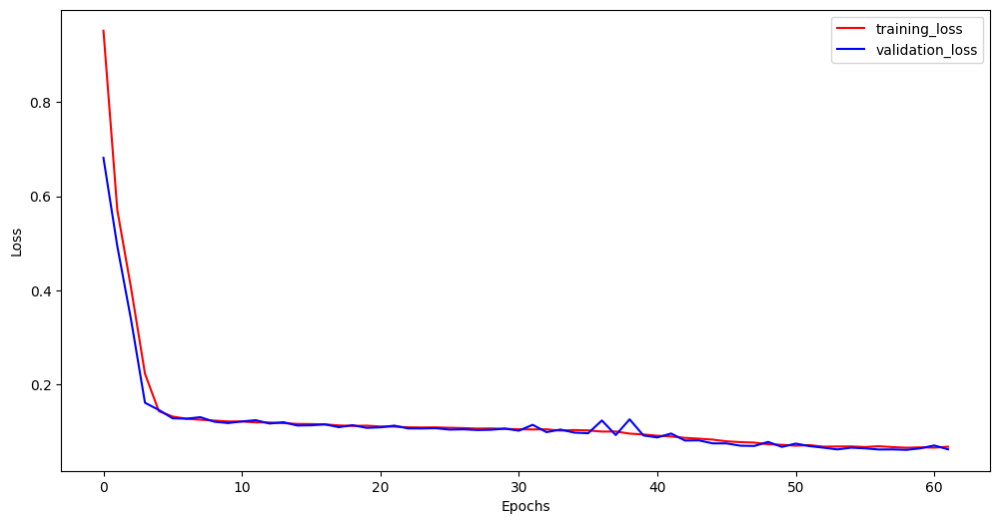

In [ ]:
plt.figure(figsize=(12,6))

plt.plot(range(len(history['val_loss'])), history['loss'], c='r', label='training_loss')
plt.plot(range(len(history['val_loss'])), history['val_loss'], c='b', label='validation_loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

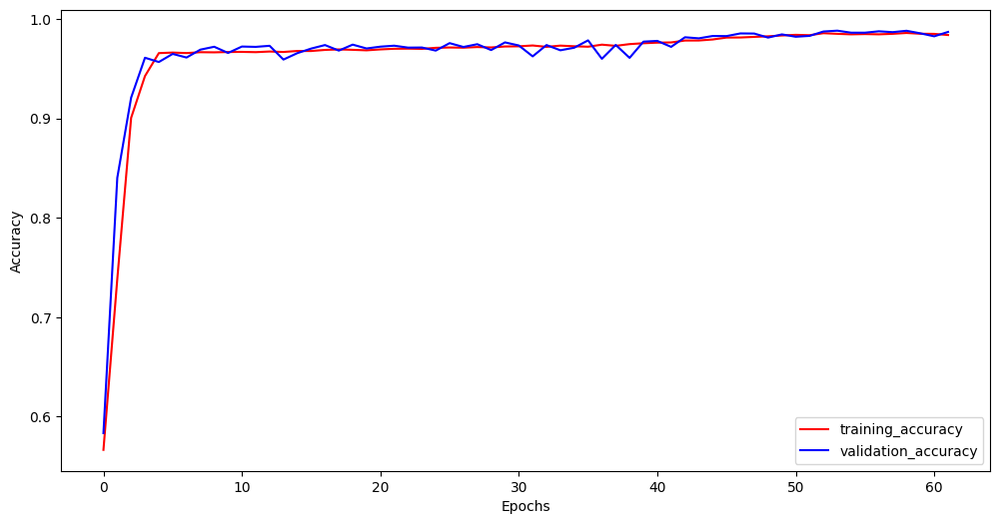

In [ ]:
plt.figure(figsize=(12,6))

plt.plot(range(len(history['val_accuracy'])), history['accuracy'], c='r', label='training_accuracy')
plt.plot(range(len(history['val_accuracy'])), history['val_accuracy'], c='b', label='validation_accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

In [ ]:
# ANN Predictions

In [ ]:
nn_predictions = nn.predict(X_test)
nn_predictions[:5]

292/292 [==============================] - 1s 2ms/step


array([[6.71772927e-04, 9.42591205e-03, 9.89901006e-01, 1.31064405e-06,
        2.46503428e-25],
       [4.66989745e-17, 2.22373254e-15, 9.92750557e-08, 3.37099482e-05,
        9.99966145e-01],
       [1.65734082e-09, 2.90415064e-03, 7.63658993e-03, 9.89459157e-01,
        6.74562273e-08],
       [6.19748025e-04, 7.13343639e-03, 9.92246747e-01, 5.20487120e-09,
        3.94773707e-34],
       [1.06926396e-04, 6.41976111e-03, 9.93473232e-01, 2.48062761e-08,
        1.70092225e-32]], dtype=float32)

In [ ]:
nn_pred = [np.argmax(prediction) for prediction in nn_predictions]

In [ ]:
pd.DataFrame(zip(useful_cluster_data.user_id.values, y_test, nn_pred), columns=['user_id','actual', 'nn_predictions'], index=X_test.index)

,user_id,actual,nn_predictions
8398,1.3135543336100173e+18,2,2
2622,1.3135555415863468e+18,4,4
15953,1.313565915903689e+18,3,3
13754,1.313582215799505e+18,2,2
12610,1.3135910334428618e+18,2,2
...,...,...,...
25911,1.515915625547425e+18,4,4
12604,1.5159156255474342e+18,2,2
26991,1.5159156255474348e+18,3,3
14233,1.515915625547463e+18,2,2


In [ ]:
nn_predictions_samples = pd.DataFrame(nn_pred, columns=['nn_predictions'], index=X_test.index)
nn_predictions_samples.head()

,nn_predictions
8398,2
2622,4
15953,3
13754,2
12610,2


In [ ]:
# Classification Report 
print(f"Classification Reports:\n {classification_report(y_test, nn_pred, zero_division=1)}")

Classification Reports:
               precision    recall  f1-score   support

           0       1.00      0.00      0.00        10
           1       1.00      0.00      0.00        41
           2       0.99      1.00      0.99      5284
           3       0.99      0.99      0.99      3511
           4       0.98      0.97      0.98       478

    accuracy                           0.99      9324
   macro avg       0.99      0.59      0.59      9324
weighted avg       0.99      0.99      0.99      9324



In [ ]:
# Confusion Matrix
cf = confusion_matrix(y_test, nn_pred)
pd.DataFrame(cf, index=list(range(5)), columns=list(range(5)))

,0,1,2,3,4
0,0,0,10,0,0
1,0,0,30,11,0
2,0,0,5262,22,0
3,0,0,15,3486,10
4,0,0,0,13,465


Text(0.5, 1.0, 'ANN Confusion Matrix')

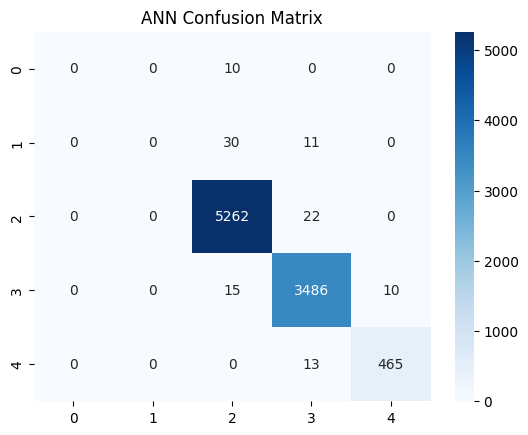

In [ ]:
sns.heatmap(cf, cmap='Blues', annot=True, fmt='.0f')
plt.title('ANN Confusion Matrix')

In [ ]:
# Evaluation
nn_evals = [
    np.round(accuracy_score(y_test, nn_pred), 5),
    np.round(precision_score(y_test, nn_pred, average='macro'), 5),
    np.round(recall_score(y_test, nn_pred, average='macro'), 5)
]

nn_results = pd.DataFrame(nn_evals, columns=['ANN'], index=EVAL_METRICS)
nn_results

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,ANN
accuracy,0.98810
precision,0.59112
recall,0.59230


Text(0, 0.5, 'Score')

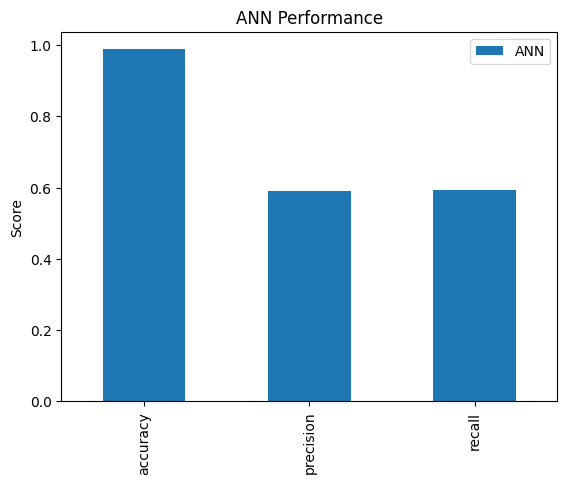

In [ ]:
nn_results.plot.bar(title='ANN Performance')
plt.ylabel('Score')

In [ ]:
plotly.bar(nn_results, title='ANN Performance')

# Comparative Performance Evaluations

In [ ]:
combined_results = pd.concat([nb_results, svc_results, rf_results, xgb_results, nn_results], axis='columns')
combined_results

,NB_baseline,SVM,RF,XGB,ANN
accuracy,0.76233,0.97029,0.9971,0.99260,0.98810
precision,0.93559,0.96498,0.9970,0.98717,0.59112
recall,0.76233,0.97029,0.9971,0.99260,0.59230


In [ ]:
combined_predictions = pd.DataFrame(
    zip(useful_cluster_data.user_id.values, useful_cluster_data.Recency.values, 
        useful_cluster_data.Frequency.values, useful_cluster_data.Monetary.values, 
        y_test, nb_pred, svc_pred, rf_pred, xgb_pred, nn_pred), 
    columns=['user_id', 'Recency', 'Frequency', 'Monetary', 'actual', 'nb_predictions', 
             'svc_predictions', 'rf_predictions', 'xgb_predictions', 'nn_predictions'], 
    index=X_test.index)

In [ ]:
# First 20 predictions
combined_predictions.iloc[:20]

,user_id,Recency,Frequency,Monetary,actual,nb_predictions,svc_predictions,rf_predictions,xgb_predictions,nn_predictions
8398,1.3135543336100173e+18,521,1,272.47,2,2,2,2,2,2
2622,1.3135555415863468e+18,56,4,1497.34,4,4,4,4,4,4
15953,1.313565915903689e+18,103,4,1497.34,3,3,3,3,3,3
13754,1.313582215799505e+18,135,1,130.00,2,2,2,2,2,2
12610,1.3135910334428618e+18,436,6,1497.34,2,2,2,2,2,2
23243,1.3135965984789635e+18,703,2,23.98,3,0,3,3,3,3
23339,1.3136054893297016e+18,99,10,1497.34,3,0,3,3,3,3
27774,1.3136117717176166e+18,302,1,480.14,3,3,3,3,3,3
15481,1.3136343076794537e+18,715,3,1345.74,2,0,2,2,2,2
30009,1.3136433261796398e+18,20,4,1497.34,3,3,3,3,3,3


In [ ]:
# Last 20 predictions
combined_predictions.iloc[-20:]

,user_id,Recency,Frequency,Monetary,actual,nb_predictions,svc_predictions,rf_predictions,xgb_predictions,nn_predictions
15843,1.5159156255473503e+18,361,1,87.21,2,2,2,2,2,2
2814,1.515915625547355e+18,354,1,493.01,2,2,2,2,2,2
10943,1.515915625547378e+18,344,1,313.56,2,2,2,2,2,2
16441,1.5159156255473815e+18,356,1,364.25,2,0,2,2,2,2
16175,1.515915625547381e+18,363,1,208.08,2,0,2,2,2,2
20928,1.5159156255473828e+18,296,1,109.45,2,0,2,2,2,2
2697,1.5159156255473833e+18,363,1,205.34,4,3,4,4,4,4
25290,1.515915625547384e+18,344,2,547.67,3,3,3,3,3,3
24122,1.5159156255473907e+18,350,1,314.93,4,4,4,4,4,4
28803,1.515915625547397e+18,360,1,458.77,3,3,3,3,3,3


In [ ]:
combined_predictions.to_csv(f'{RESULT_PATH}/COMBINED_PREDICTIONS.csv')

## Accuracy

In [ ]:
plotly.bar(combined_results.loc['accuracy'].sort_values(ascending=False), color=combined_results.loc['accuracy'].index,
          title='Comparative Performance on [Accuracy] across Algorithmns')

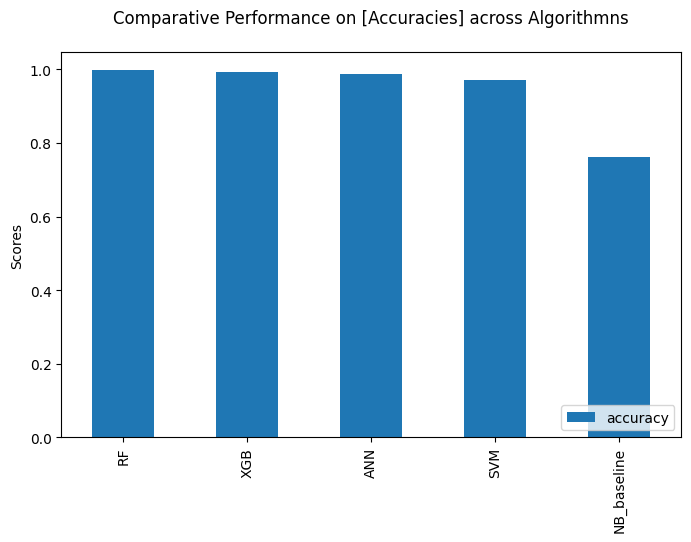

In [ ]:
# Accuracies
plt.figure(figsize=(8,5))
combined_results.loc['accuracy'].sort_values(ascending=False).plot.bar(title='Comparative Performance on [Accuracies] across Algorithmns\n')
plt.ylabel('Scores')
plt.legend(loc='lower right')

## Precision

In [ ]:
plotly.bar(combined_results.loc['precision'].sort_values(ascending=False), color=combined_results.loc['precision'].index,
          title='Comparative Performance on [Precision] across Algorithmns')

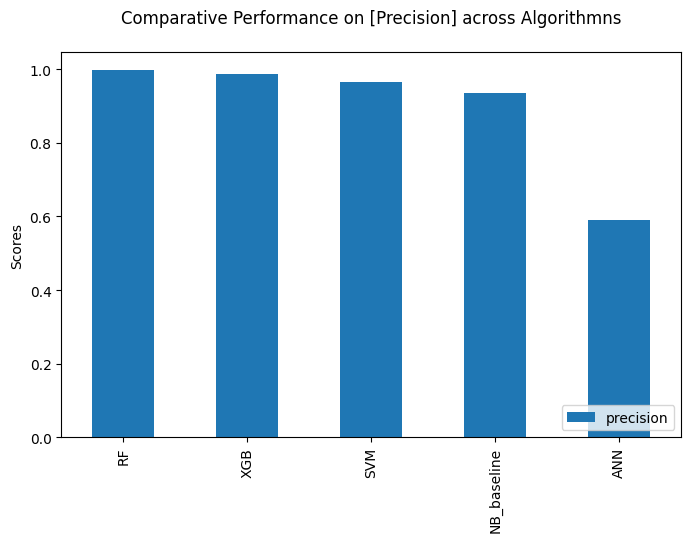

In [ ]:
# Precision
plt.figure(figsize=(8,5))
combined_results.loc['precision'].sort_values(ascending=False).plot.bar(title='Comparative Performance on [Precision] across Algorithmns\n')
plt.ylabel('Scores')
plt.legend(loc='lower right')

## Recall

In [ ]:
plotly.bar(combined_results.loc['recall'].sort_values(ascending=False), color=combined_results.loc['recall'].index,
          title='Comparative Performance on [Recall] across Algorithmns')

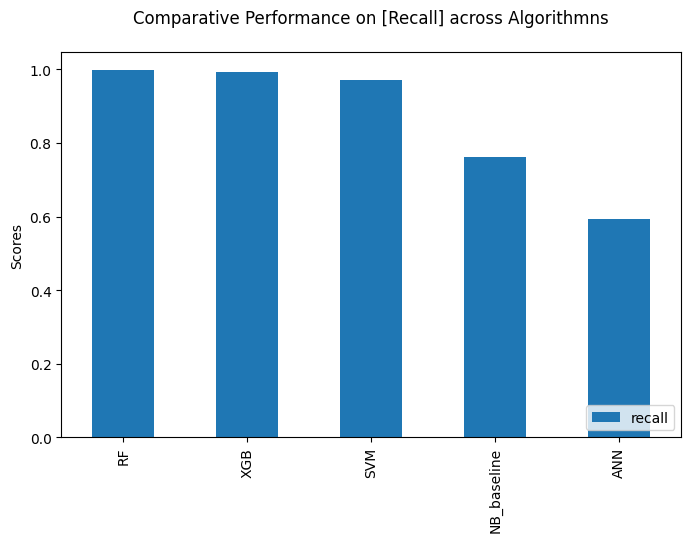

In [ ]:
# Precision
plt.figure(figsize=(8,5))
combined_results.loc['recall'].sort_values(ascending=False).plot.bar(title='Comparative Performance on [Recall] across Algorithmns\n')
plt.ylabel('Scores')
plt.legend(loc='lower right')

## All Metrics Combined

In [ ]:
combined_results

,NB_baseline,SVM,RF,XGB,ANN
accuracy,0.76233,0.97029,0.9971,0.99260,0.98810
precision,0.93559,0.96498,0.9970,0.98717,0.59112
recall,0.76233,0.97029,0.9971,0.99260,0.59230


<Figure size 1000x500 with 0 Axes>

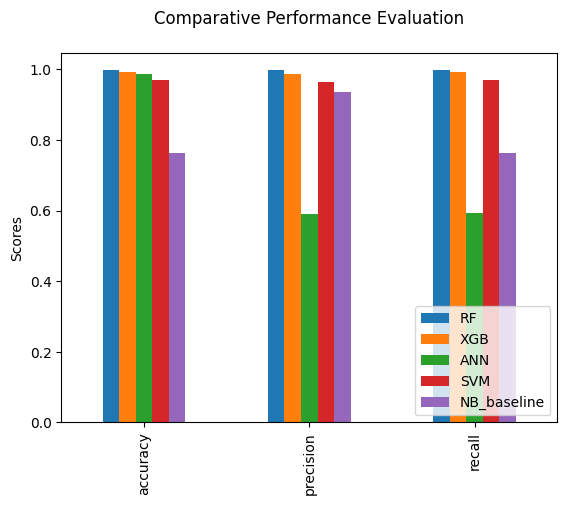

In [ ]:
plt.figure(figsize=(10,5))
combined_results.T.sort_values(by='accuracy', ascending=False).T.plot.bar(title='Comparative Performance Evaluation\n')
plt.ylabel('Scores')
plt.legend(loc='lower right')

# Saving all trained models and results

## saving results

In [ ]:
#saving results
nb_results.to_csv(f'{RESULT_PATH}/nb_results.csv')
svc_results.to_csv(f'{RESULT_PATH}/svc_results.csv')
rf_results.to_csv(f'{RESULT_PATH}/rf_results.csv')
xgb_results.to_csv(f'{RESULT_PATH}/xgb_results.csv')
nn_results.to_csv(f'{RESULT_PATH}/nn_results.csv')

combined_results.to_csv(f'{RESULT_PATH}/combined_results.csv')

## saving trained models

In [ ]:
# Saving encoded Tokenizer model utility
def save_model_pickle(model, filename):
    try:
        pickle.dump(model, open(f'{MODEL_PATH}/{filename}', 'wb'))
        print('Saved')
    except Exception as err:
        print(err)

        
# Loading saved Pickle model
def load_model_pickle(filename):
    try:
        model = pickle.load(open(f'{MODEL_PATH}/{filename}', 'rb'))
        return model
    except Exception as err:
        print(err)
        return None

In [ ]:
# Saving models
save_model_pickle(model=nb, filename='nb_model.pickle')
save_model_pickle(model=svc, filename='svc_model.pickle')
save_model_pickle(model=rf, filename='rf_model.pickle')
save_model_pickle(model=xgb, filename='xgb_model.pickle')

xgb.save_model(f'{MODEL_PATH}/xgb_model.json')
nn.save(f'{MODEL_PATH}/ann_model.h5')

# Saving scaler object
save_model_pickle(model=scaler, filename='scaler.pickle')

Saved
Saved
Saved
Saved
Saved


## Loading saved trained model

In [ ]:
# To load saved models
nb2 = load_model_pickle(filename='nb_model.pickle')
svc2 = load_model_pickle(filename='svc_model.pickle')
rf2 = load_model_pickle(filename='rf_model.pickle')
xgb_pickle2 = load_model_pickle(filename='xgb_model.pickle')

# loading XGBoost trained model
from xgboost import Booster
xgb2 = Booster({'nthread': 2})
xgb2.load_model(f'{MODEL_PATH}/xgb_model.json')

# loading keras-based ANN trained model
from tensorflow.keras.models import load_model
nn2 = load_model(f'{MODEL_PATH}/ann_model.h5')

# loading scaler object
scaler2 = load_model_pickle(filename='scaler.pickle')

### Sample usage of saved trained xgboost model after loaded

In [ ]:
# Sample usage of saved trained xgboost model when loaded
from xgboost import DMatrix

# XGB
predictions = xgb2.predict(DMatrix(X_test))
preds_xgb = [np.argmax(x) for x in predictions]

# ANN
predictions = nn2.predict(X_test)
preds_nn = [np.argmax(x) for x in predictions]

# RF
preds_rf = rf2.predict(X_test)

# SVC
preds_svc = svc2.predict(X_test)

# NB
preds_nb = nb2.predict(X_test)


print(f'XGB Accuracy: {accuracy_score(y_test, preds_xgb)}')
print(f'ANN Accuracy: {accuracy_score(y_test, preds_nn)}')
print(f'RF Accuracy: {accuracy_score(y_test, preds_rf)}')
print(f'SVC Accuracy: {accuracy_score(y_test, preds_svc)}')
print(f'NB Accuracy: {accuracy_score(y_test, preds_nb)}')



292/292 [==============================] - 1s 2ms/step
XGB Accuracy: 0.9925997425997426
ANN Accuracy: 0.9880952380952381
RF Accuracy: 0.997104247104247
SVC Accuracy: 0.9702917202917203
NB Accuracy: 0.7623337623337624


## Saving MinMax Scaler config data (for production)

In [ ]:
# Saving scale min-max values
import pandas as pd
idx = ['Recency', 'Frequency', 'Monetary']
scaled_data = {
    'mini': [data_summary.Recency.min(), data_summary.Frequency.min(), data_summary.Monetary.min()],
    'maxi': [data_summary.Recency.max(), data_summary.Frequency.max(), data_summary.Monetary.max()]
}

scale_data_df = pd.DataFrame(scaled_data, index=idx) 
scale_data_df

,mini,maxi
Recency,0.00,715.00
Frequency,1.00,20.00
Monetary,1.03,1497.34


In [ ]:
scale_data_df.to_csv(f'{RESULT_PATH}/scale_data_df.csv')

In [ ]:
pd.read_csv(f'{RESULT_PATH}/scale_data_df.csv', index_col=0)

,mini,maxi
Recency,0.00,715.00
Frequency,1.00,20.00
Monetary,1.03,1497.34


## More sample tests

In [ ]:
recency = int(input('When was the last time customer patronized (in days)? '))
frequency = int(input('How many times has the customer patronized you? '))
monetary = float(input('How much in total has the customer spent (USD)? '))

# Scaling
scaled_recency = (recency - scale_data_df.mini[0]) / (scale_data_df.maxi[0] - scale_data_df.mini[0])
scaled_frequency = (frequency - scale_data_df.mini[1]) / (scale_data_df.maxi[1] - scale_data_df.mini[1])
scaled_monetary = (monetary - scale_data_df.mini[2]) / (scale_data_df.maxi[2] - scale_data_df.mini[2])

raw_data = pd.DataFrame(np.array([recency, frequency, monetary]).reshape(1,-1), columns=['Recency', 'Frequency', 'Monetary'])
print()
print(f'Raw Input Data: \n{raw_data}')

# Preparing data
input_data = pd.DataFrame(np.array([scaled_recency, scaled_frequency, scaled_monetary]).reshape(1,-1), columns=['Recency', 'Frequency', 'Monetary'])
print()
print(f'Scaled Input Data: \n{input_data}')

# Predicting
from xgboost import DMatrix
pred = xgb2.predict(DMatrix(input_data))

print()
print(f'Prediction: {pred}')
print(f'Prediction Class: {np.argmax(pred)}')
print(f'Confidence: {np.round(pred.max() * 100, 1)}%')

In [ ]:
# loading sclale data
def load_scale_data():
    return pd.read_csv(f'{RESULT_PATH}/scale_data_df.csv', index_col=0)

def load_keys_table():
    return pd.read_csv(f'{MODEL_PATH}/LABEL_KEYS_TABLE.csv')

# Make prediction
def make_prediction(model=None, recency=0, frequency=0, monetary=0.0, model_code='rf'):
    """
        Scales and preprocesses input datapoints and make prediction using 'model'
        
        Args:
            model: trained model to use. An instance of one of (RF, NB, SVC, ANN, XGB )
            recency: Number of days ago since customer last patronized (days)
            frequency: Number of times customer patronized (int)
            monetary: Total money spent by customer across all transactions
            model_code: code name for trained model type
                Values:
                    'rf' for Random Forest | 
                    'nb' for Naive Baye's | 
                    'svc' for Support Vector Classifier | 
                    'nn' for Neural Networks | 
                    'xgb' for XGBoost |
                    'all' for all trained models

    """

    # scaling the data collected
    scale_data = load_scale_data()
    scaled_recency = (recency - scale_data.mini[0]) / (scale_data.maxi[0] - scale_data.mini[0])
    scaled_frequency = (frequency - scale_data.mini[1]) / (scale_data.maxi[1] - scale_data.mini[1])
    scaled_monetary = (monetary - scale_data.mini[2]) / (scale_data.maxi[2] - scale_data.mini[2])

    temp = pd.DataFrame(np.array([
        recency, frequency, monetary]).reshape(1,-1), 
        columns=['Recency', 'Frequency', 'Monetary'])
    
    input_data = pd.DataFrame(np.array([
        scaled_recency, scaled_frequency, scaled_monetary]).reshape(1,-1), 
        columns=['Recency', 'Frequency', 'Monetary'])

    #     st.write('Raw Input Data:')
    #     st.dataframe(temp)

    #     st.write('Scaled Input Data:')
    #     st.dataframe(input_data)
    
    prediction = None

    if model_code == 'all':
        predictions = {}

        # loading trained models
        nb, svc, rf, xgb, nn = get_trained_model(algorithm='All')

        # making predictions
        predictions['nb_pred'] = nb.predict_proba(input_data)
        predictions['rf_pred'] = rf.predict_proba(input_data)
        predictions['svc_pred'] = svc.predict_proba(input_data)
        # XGB
        data = DMatrix(input_data)
        predictions['xgb_pred'] = xgb.predict(data)
        # ANN
        predictions['nn_pred'] = nn.predict(input_data)

        return predictions

    elif model_code == 'xgb':
        data = DMatrix(input_data)
        prediction = model.predict(data)

    elif model_code == 'nn':
        prediction = model.predict(input_data)
    
    else:
        prediction = model.predict_proba(input_data)
    
    if prediction is None:
        st.error('Something went wrong. Sorry, Could not make prediction')
        
    KEYS_TABLE = load_keys_table()
    predicted_class = prediction.argmax()
    level = KEYS_TABLE[KEYS_TABLE.class_labels == predicted_class].levels.values[0]
    customer_rank = KEYS_TABLE[KEYS_TABLE.class_labels == predicted_class].customer_rank.values[0]
    
    results = {
        'prediction_proba': prediction,
        'predicted_class': predicted_class,
        'level': level,
        'customer_rank': customer_rank
    }

    return results


In [ ]:
LABEL_KEYS_DF[LABEL_KEYS_DF.class_labels == 0]

In [ ]:
results1 = make_prediction(model=rf2, recency=500, frequency=1, monetary=5, model_code='rf')

In [ ]:
results1